In [496]:
from matplotlib import pyplot as plt
from matplotlib import axes as ax
import numpy as np
import scipy.optimize as opt
import scipy.integrate as integrate

In [497]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

In [498]:
def tridiagonal(n, a=1, b=2, c=1):
    """
    Creates a tridiagonal matrix of size n x n.

    Parameters:
    - n: The size of the matrix (n x n).
    - a: Value for the sub-diagonal elements.
    - b: Value for the main diagonal elements.
    - c: Value for the super-diagonal elements.

    Returns:
    - A tridiagonal matrix of size n x n.
    """

    # Main diagonal of size n
    main_diag = b * np.ones(n)

    # Sub-diagonal and super-diagonal of size n-1
    sub_diag = a * np.ones(n - 1)
    super_diag = c * np.ones(n - 1)

    # Using numpy's diag function to create the tridiagonal matrix
    matrix = np.diag(main_diag) + np.diag(sub_diag, k=-1) + np.diag(super_diag, k=1)

    return matrix

In [499]:
def A(n, m):
    pomozna = tridiagonal(n, 1+m, -1-2*m, m)
    pomozna[0, 0] = -1-m
    pomozna[n - 1, n - 1] = -1-m
    return pomozna

In [500]:
def B(n, p):
    
    pomozna = tridiagonal(n, 1, -1-p, p)
    pomozna[0, 0] = -1
    pomozna[n - 1, n - 1] = -1
    return pomozna

In [501]:
t = np.linspace(0, 10, 1000)

In [502]:
#komentarji

#
#za m=1 mora biti vstopni tok ničeln, zaprt sistem
#za m=0 moramo dobiti primer iz originalnega sistema

#vstopni tok fiksiran na 1

# 3D graf

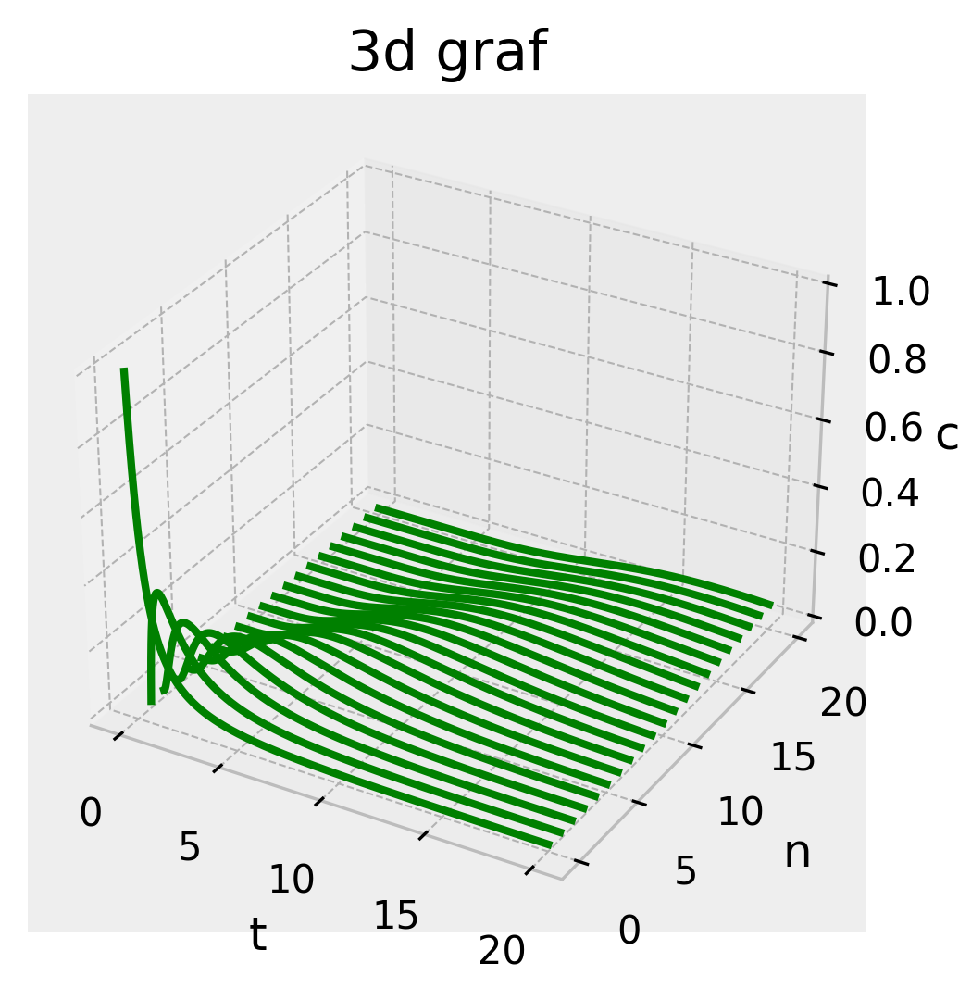

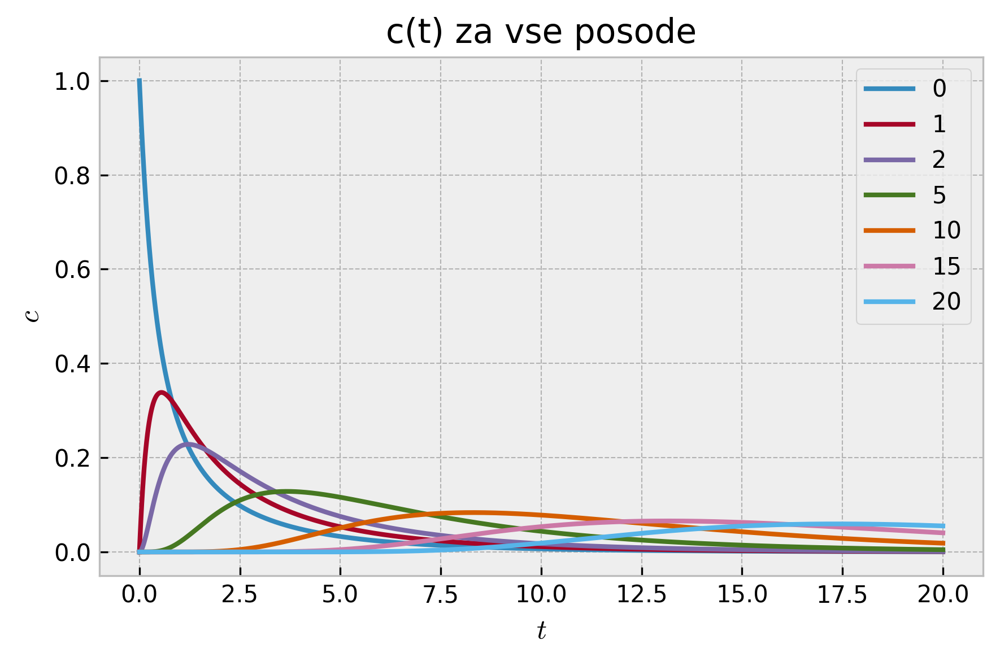

<Figure size 1800x1200 with 0 Axes>

In [503]:
m = 1
n = 21
c0 = np.zeros(n)
c0[0] = 1
mat = A(n, m)


t = np.linspace(0, 20, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.style.use('bmh')

ax = plt.axes(projection ='3d')
ax.set_xlabel("t")
ax.set_ylabel("n")
ax.set_zlabel("c")
ax.zaxis.labelpad=-0.7
plt.title("3d graf")

for i in range(n):
    ax.plot3D(t, i*np.ones_like(t), y[:, i], 'green')
plt.savefig("3d.png")
plt.show()
plt.clf()




plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()

plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("m0.25area.png")
#plt.show()
plt.clf()

# bakterije

In [504]:
m = 2
n = 21
c0 = np.zeros(n)
c0[0] = 1

mat_b = tridiagonal(n, 0, 0, 0)#A(n, m)
mat_b = A(n, m)



t = np.linspace(0, 10, 1000)
def sys_b(c, t):
    pomozna = np.dot(mat_b, c)
    return pomozna + c*(1-c)
y = integrate.odeint(sys_b, c0, t)



In [505]:
print(np.array([1,2])*np.array([2,4]))

[2 8]


In [506]:
print(y[900, 0])
print(y[900, 1])

0.5325082261934809
0.6752369005295279


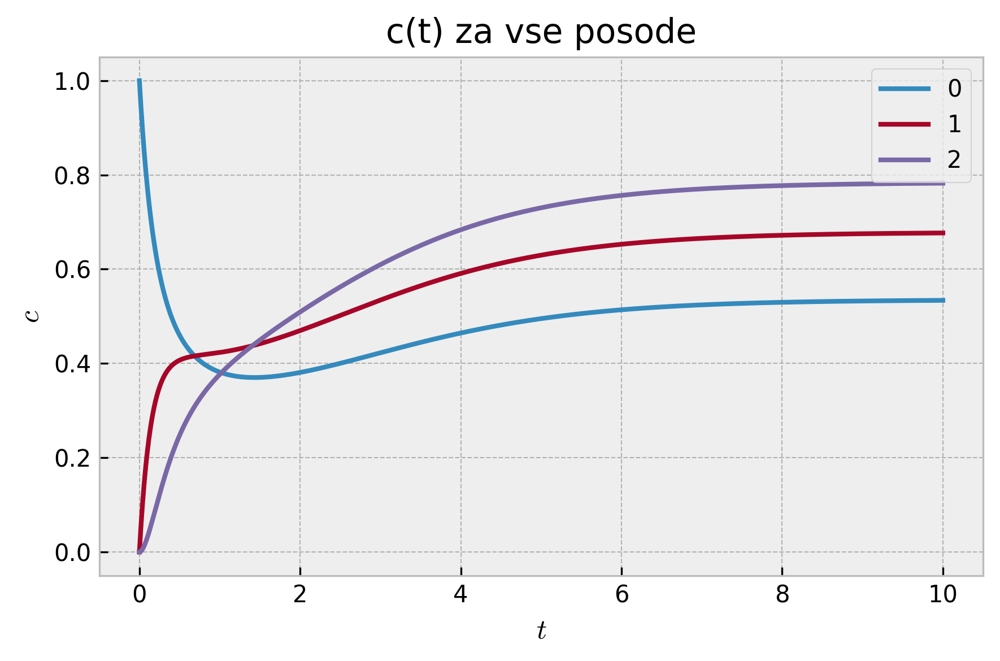

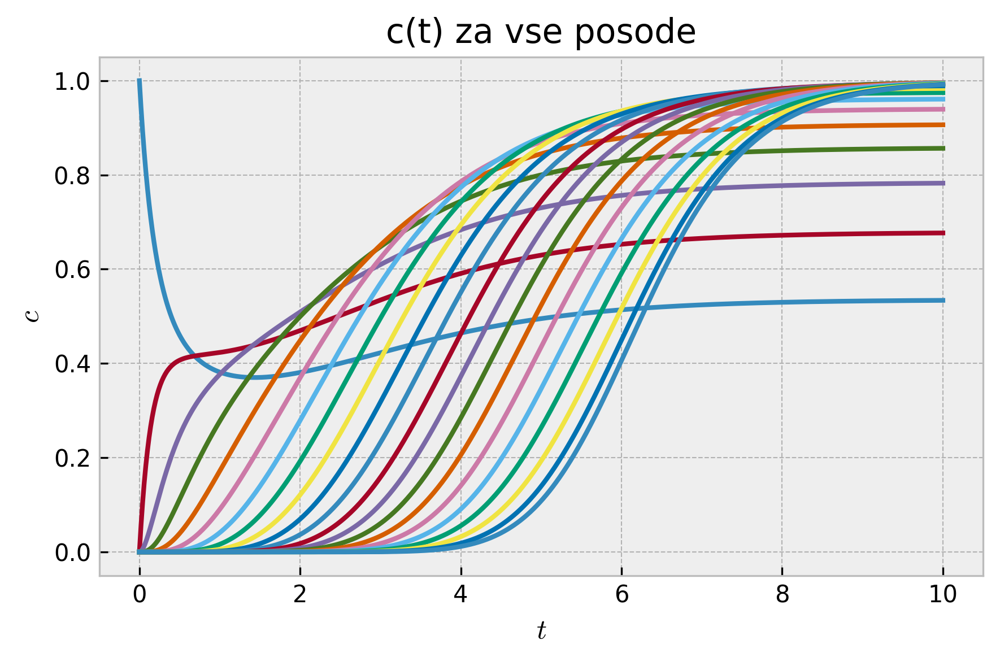

<Figure size 1800x1200 with 0 Axes>

In [507]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")

for i in range(n):
    
    if i % 5 == 0 and i != 0:
        break
        #plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("bakt3.png")
plt.show()
plt.clf()

plt.style.use('bmh')
plt.plot(t, y[:, :], label=f"0")
plt.title("c(t) za vse posode")
plt.xlabel('$t$')
plt.ylabel('$c$')
#plt.legend()
plt.tight_layout()
plt.savefig("bakt.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("pog10area.png")
#plt.show()
plt.clf()

In [508]:
m = 1
n = 21
c0 = np.zeros(n)
c0[0] = 1
mat = A(n, m)


t = np.linspace(0, 20, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

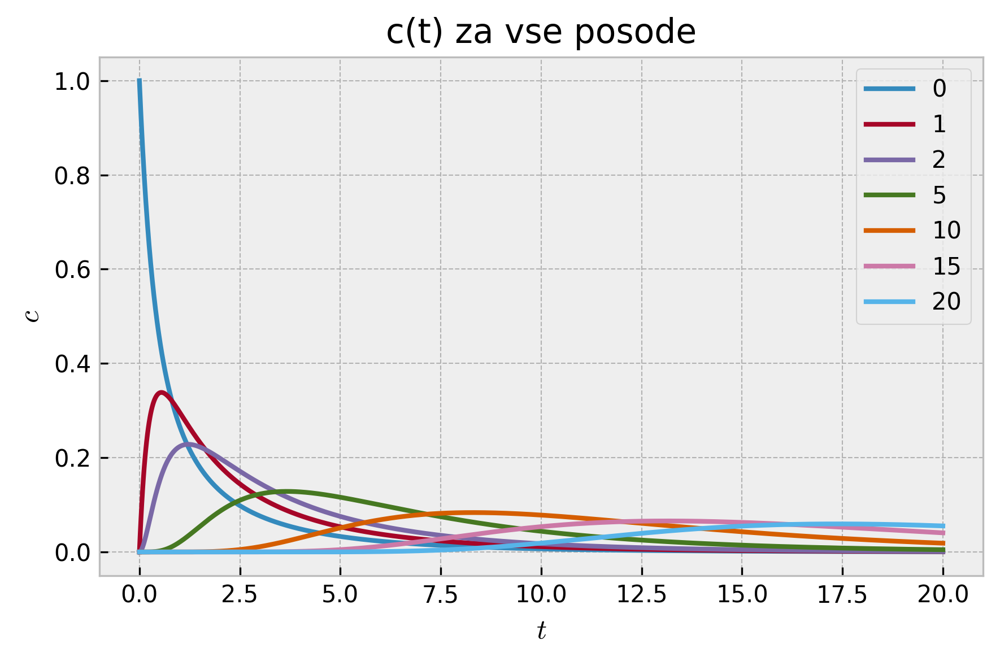

<Figure size 1800x1200 with 0 Axes>

In [509]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("lihe.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("m0.25area.png")
#plt.show()
plt.clf()

# Drugi začetni pogoji

In [510]:
m = 2
n = 21
c0 = np.zeros(n)
c0[10] = 1
toeplitz = tridiagonal(n, 1+m, -1-2*m, m)
mat = A(n, m)
krožna = tridiagonal(n, 1+m, -1-2*m, m)
krožna[n - 1, 0] = m
krožna[0, n - 1] = 1+m

t = np.linspace(0, 10, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

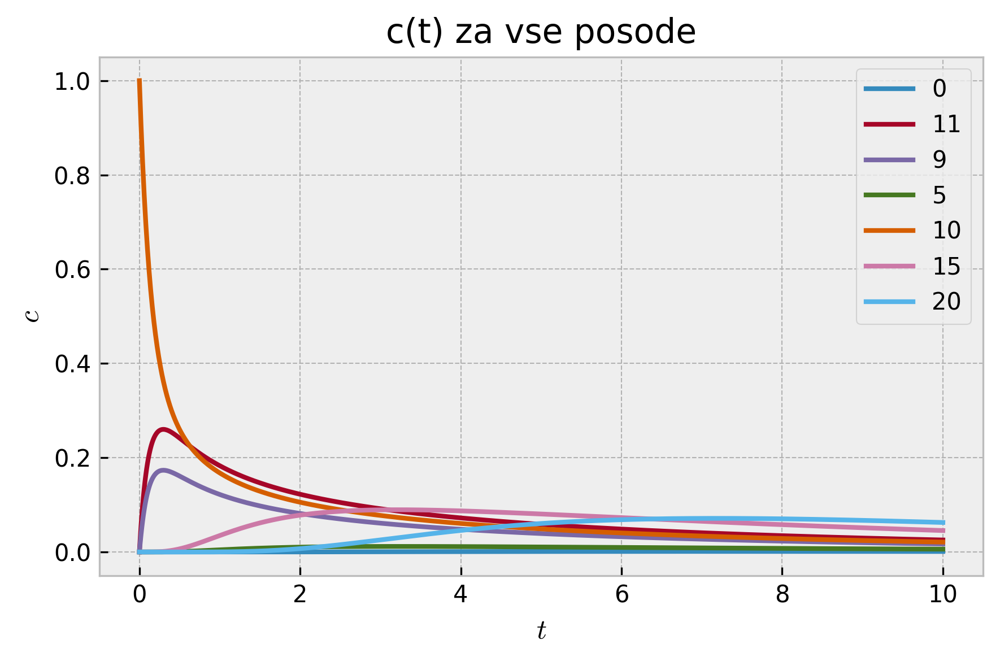

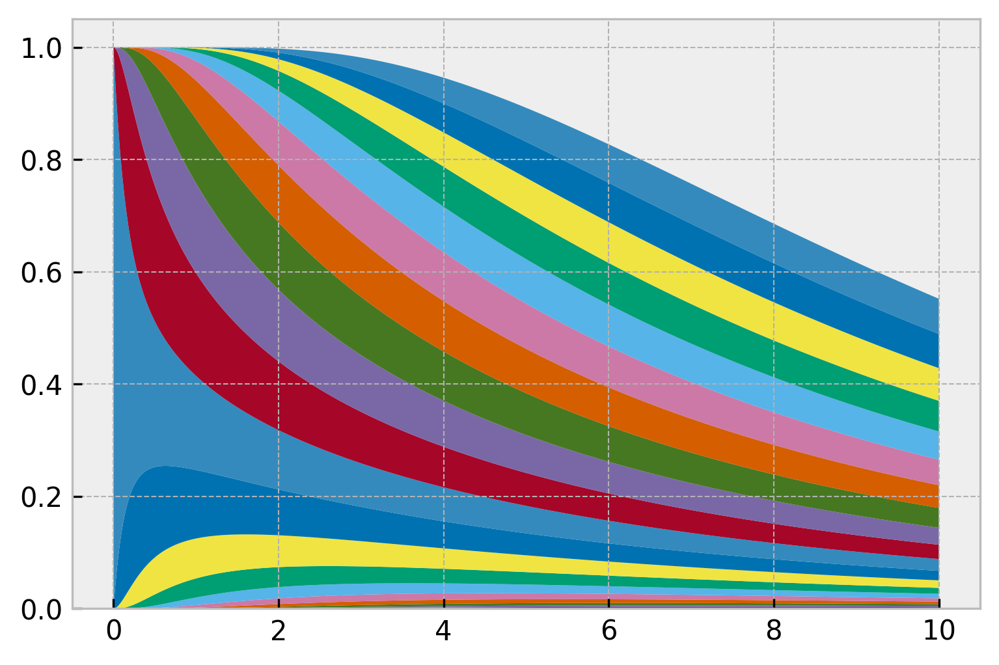

<Figure size 1800x1200 with 0 Axes>

In [511]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 11], label=f"11")
plt.plot(t, y[:, 9], label=f"9")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("pog10.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("pog10area.png")
plt.show()
plt.clf()

In [512]:
m = 0.5
n = 21
c0 = np.zeros(n)
c0[0] = 1
c0[20] = 1
toeplitz = tridiagonal(n, 1+m, -1-2*m, m)
mat = A(n, m)
krožna = tridiagonal(n, 1+m, -1-2*m, m)
krožna[n - 1, 0] = m
krožna[0, n - 1] = 1+m

t = np.linspace(0, 20, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

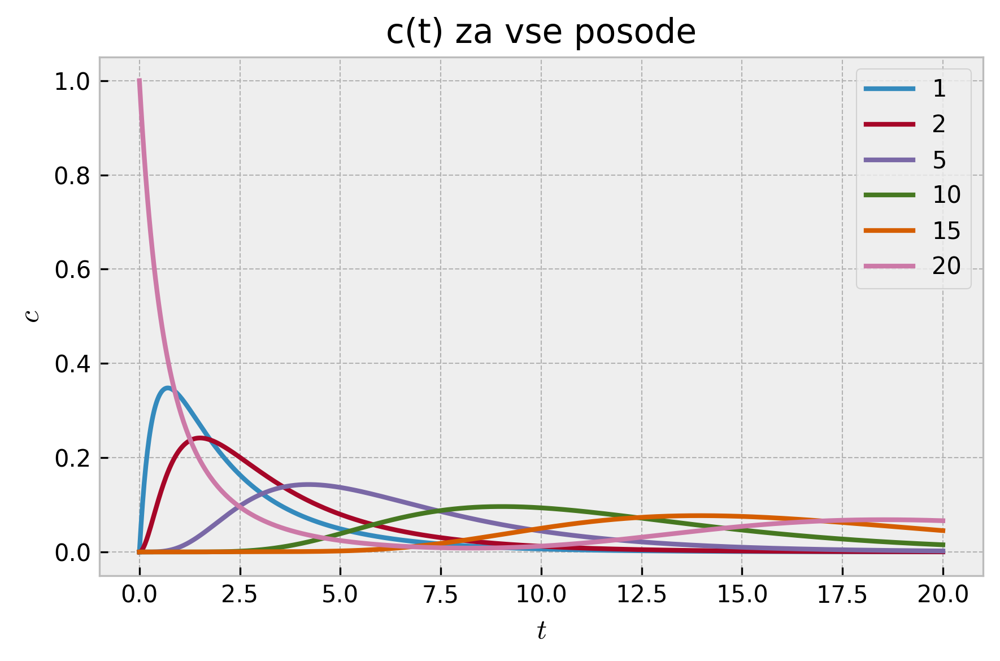

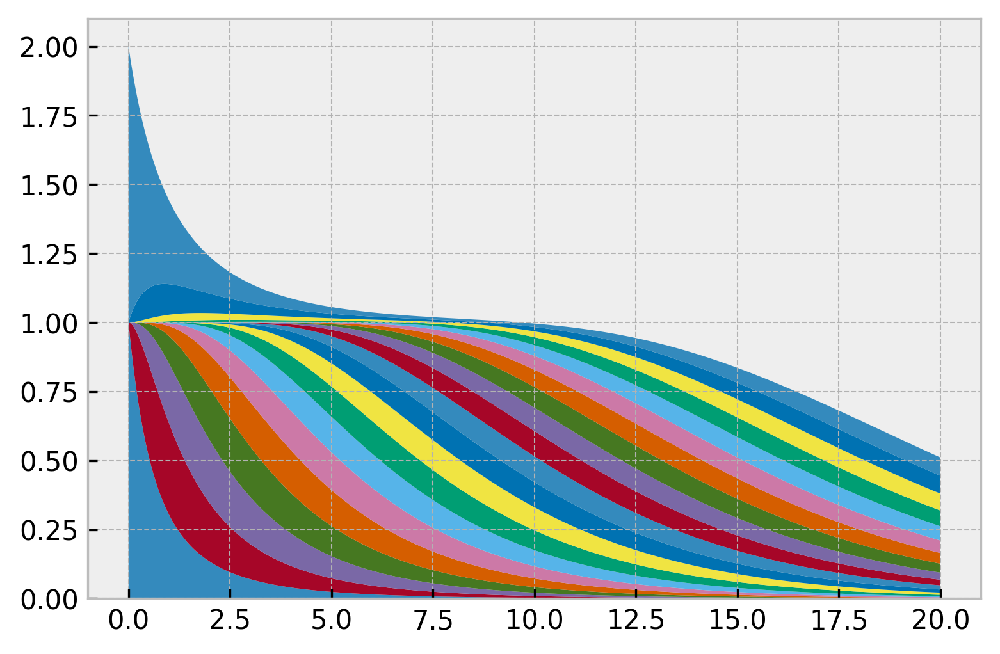

<Figure size 1800x1200 with 0 Axes>

In [513]:
plt.style.use('bmh')
#plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
#plt.savefig("m0.25.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("m0.25area.png")
plt.show()
plt.clf()

In [514]:
m = 1
n = 21
c0 = np.ones(n)

mat = A(n, m)


t = np.linspace(0, 20, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

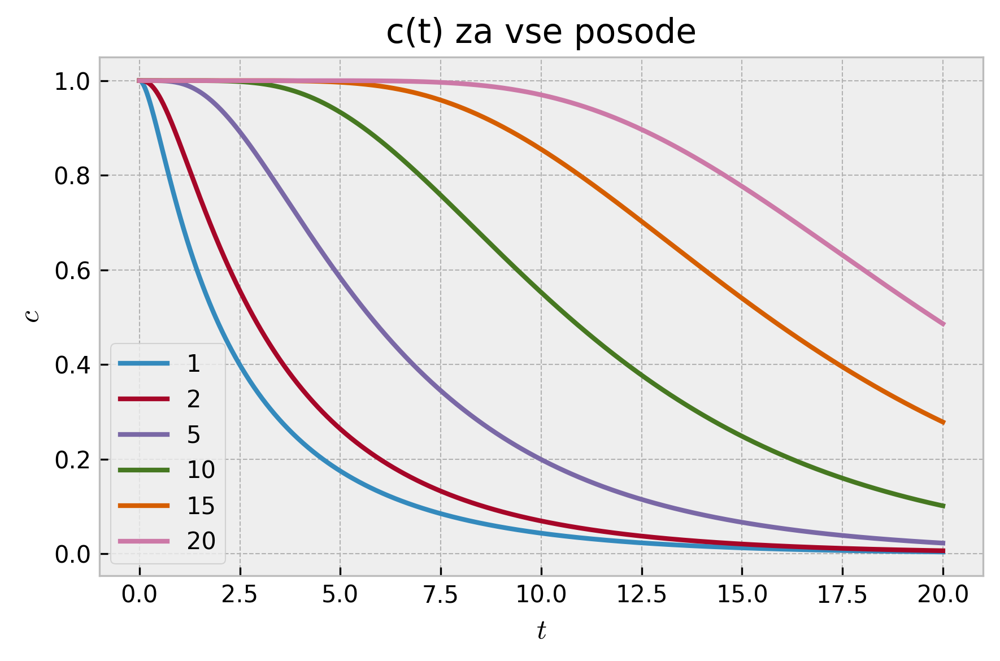

<Figure size 1800x1200 with 0 Axes>

In [515]:
plt.style.use('bmh')
#plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("pog_all.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("m0.25area.png")
#plt.show()
plt.clf()

In [516]:
m = 1
n = 21
c0 = np.zeros(n)
for i in range(21):
    if not i%2==0:
        c0[i] = 1


mat = A(n, m)


t = np.linspace(0, 20, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

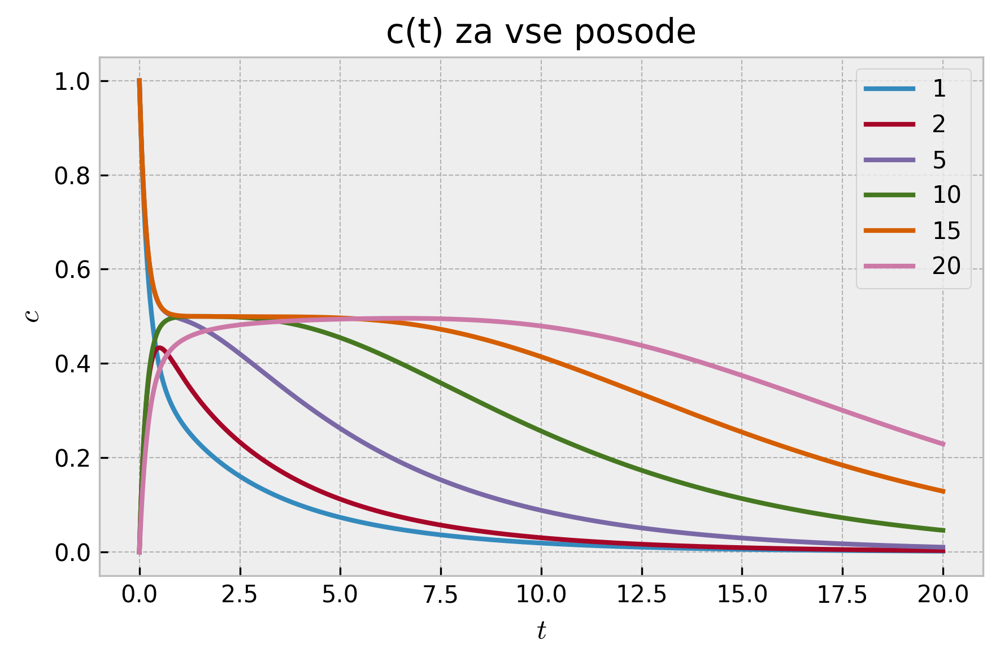

<Figure size 1800x1200 with 0 Axes>

In [517]:
plt.style.use('bmh')
#plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("lihe.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("m0.25area.png")
#plt.show()
plt.clf()

# Variacije

In [518]:
m = 0.5
n = 21
c0 = np.zeros(n)
c0[0] = 1
toeplitz = tridiagonal(n, 1+m, -1-2*m, m)
mat = A(n, m)
krožna = tridiagonal(n, 1+m, -1-2*m, m)
krožna[n - 1, 0] = m
krožna[0, n - 1] = 1+m

t = np.linspace(0, 60, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
def sys(c, t):
    return np.dot(toeplitz, c)
yt = integrate.odeint(sys, c0, t)
def sys(c, t):
    return np.dot(krožna, c)
yk = integrate.odeint(sys, c0, t)
#print(krožna)

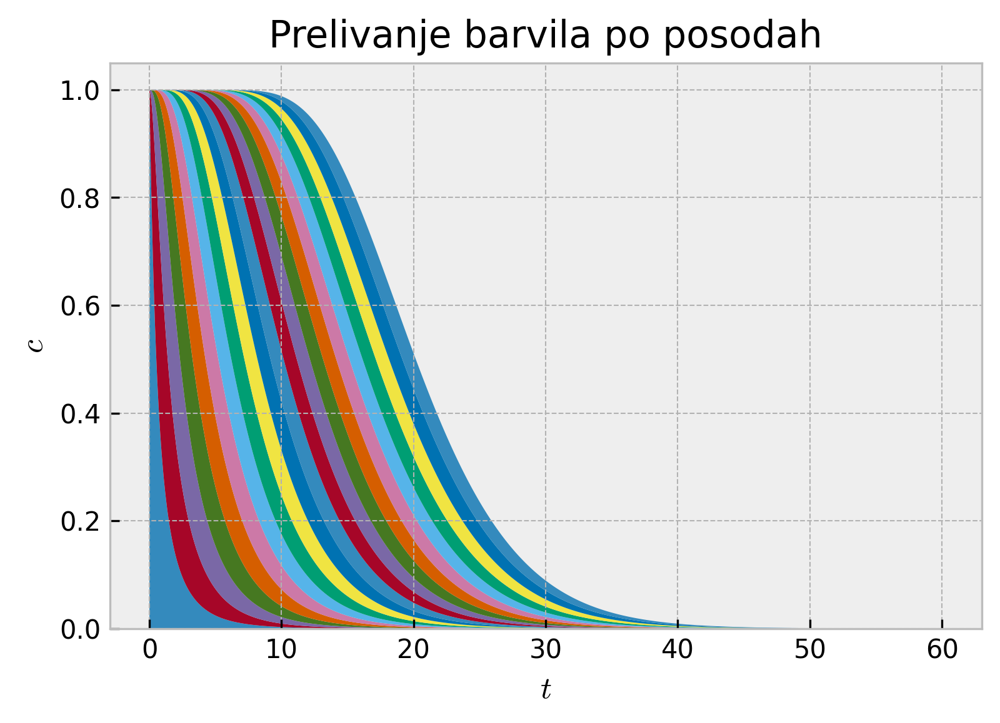

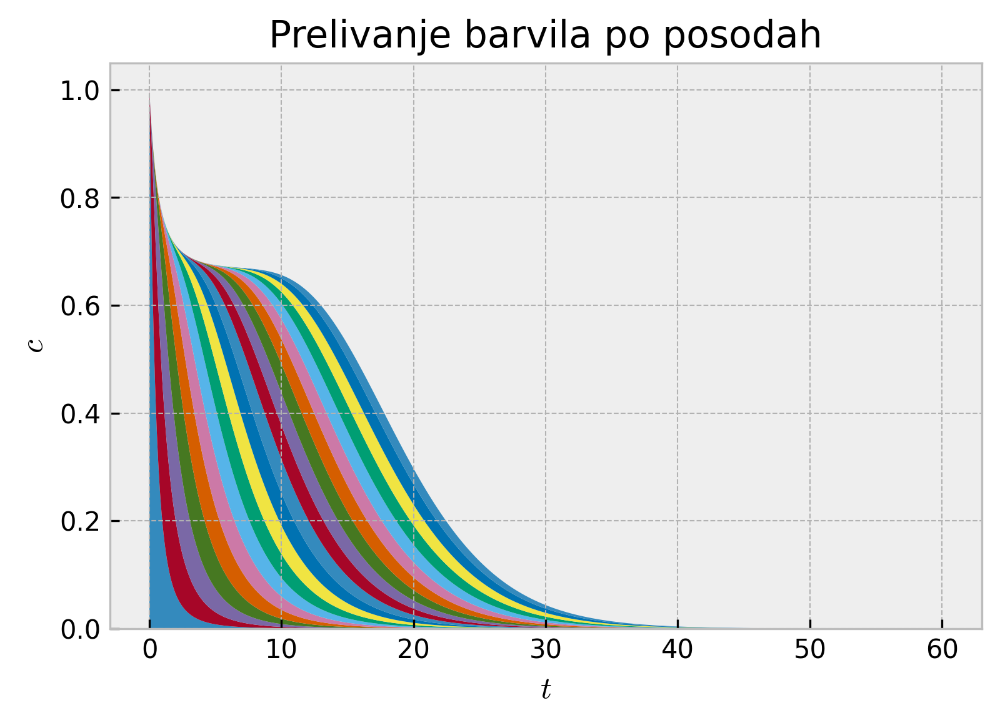

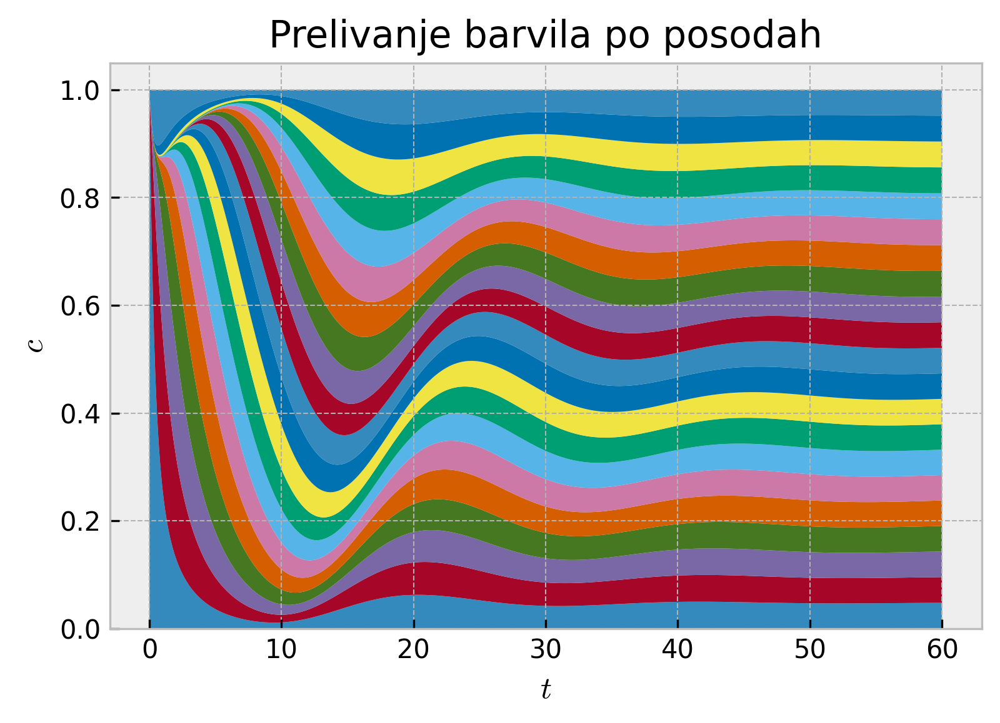

<Figure size 1800x1200 with 0 Axes>

In [519]:


plt.title("Prelivanje barvila po posodah")
plt.xlabel('$t$')
plt.ylabel('$c$')
plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("var_org.png")
plt.show()
plt.clf()

plt.title("Prelivanje barvila po posodah")
plt.xlabel('$t$')
plt.ylabel('$c$')
plt.stackplot(t, *(yt[:, i] for i in range(n)))
plt.savefig("var_top.png")
plt.show()
plt.clf()

plt.title("Prelivanje barvila po posodah")
plt.xlabel('$t$')
plt.ylabel('$c$')
plt.stackplot(t, *(yk[:, i] for i in range(n)))
plt.savefig("var_kro.png")
plt.show()
plt.clf()

# Numerične metode

In [520]:
def euler( f, x0, t ):
    """Euler's method to solve x' = f(x,t) with x(t[0]) = x0.

    USAGE:
        x = euler(f, x0, t)

    INPUT:
        f     - function of x and t equal to dx/dt.  x may be multivalued,
                in which case it should a list or a NumPy array.  In this
                case f must return a NumPy array with the same dimension
                as x.
        x0    - the initial condition(s).  Specifies the value of x when
                t = t[0].  Can be either a scalar or a list or NumPy array
                if a system of equations is being solved.
        t     - list or NumPy array of t values to compute solution at.
                t[0] is the the initial condition point, and the difference
                h=t[i+1]-t[i] determines the step size h.

    OUTPUT:
        x     - NumPy array containing solution values corresponding to each
                entry in t array.  If a system is being solved, x will be
                an array of arrays.
    """

    n = len( t )
    x = np.array( [x0] * n )
    for i in range( n - 1 ):
        h = t[i+1] - t[i]
        x[i+1] = x[i] + h * f( x[i], t[i] )

    return x


def rku4( f, x0, t ):
    """Fourth-order Runge-Kutta method to solve x' = f(x,t) with x(t[0]) = x0.

    USAGE:
        x = rku4(f, x0, t)

    INPUT:
        f     - function of x and t equal to dx/dt.  x may be multivalued,
                in which case it should a list or a NumPy array.  In this
                case f must return a NumPy array with the same dimension
                as x.
        x0    - the initial condition(s).  Specifies the value of x when
                t = t[0].  Can be either a scalar or a list or NumPy array
                if a system of equations is being solved.
        t     - list or NumPy array of t values to compute solution at.
                t[0] is the the initial condition point, and the difference
                h=t[i+1]-t[i] determines the step size h.

    OUTPUT:
        x     - NumPy array containing solution values corresponding to each
                entry in t array.  If a system is being solved, x will be
                an array of arrays.
    """

    n = len( t )
    x = np.array( [ x0 ] * n )
    for i in range( n - 1 ):
        h = t[i+1] - t[i]
        k1 = h * f( x[i], t[i] )
        k2 = h * f( x[i] + 0.5 * k1, t[i] + 0.5 * h )
        k3 = h * f( x[i] + 0.5 * k2, t[i] + 0.5 * h )
        k4 = h * f( x[i] + k3, t[i+1] )
        x[i+1] = x[i] + ( k1 + 2.0 * ( k2 + k3 ) + k4 ) / 6.0

    return x

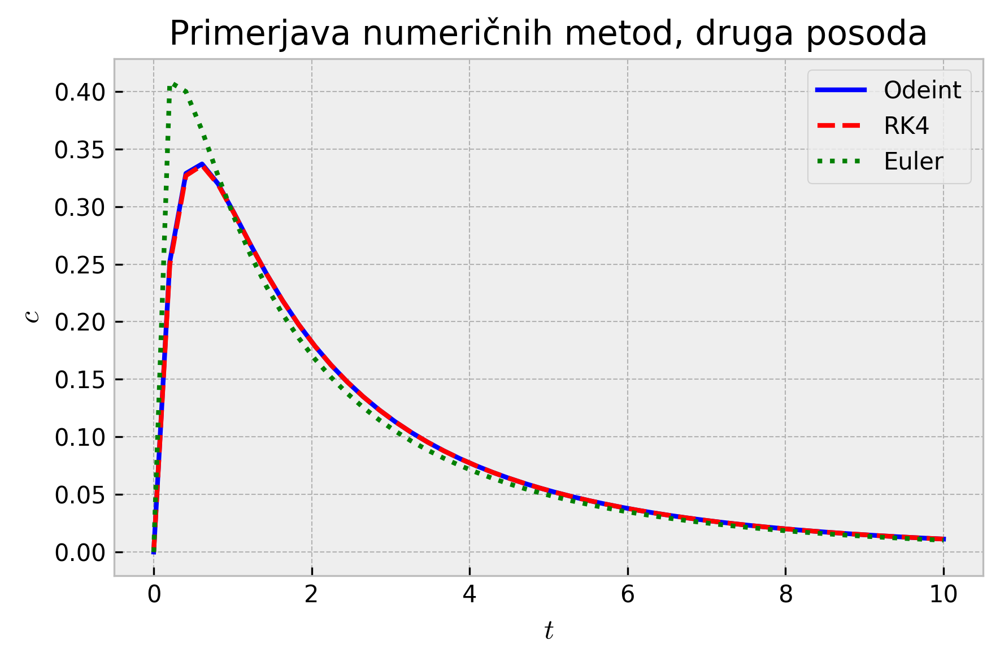

<Figure size 1800x1200 with 0 Axes>

In [521]:
m = 1
n = 21
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 10, 50)
def sys(c, t):
    return np.dot(mat, c)
y1 = integrate.odeint(sys, c0, t)
y2 = rku4(sys, c0, t)
y3 = euler(sys, c0, t)



plt.plot(t, y1[:, 1], color='blue', label=f"Odeint")
plt.plot(t, y2[:, 1], linestyle="dashed", color='red', label=f"RK4")
plt.plot(t, y3[:, 1], linestyle="dotted", color='green', label=f"Euler")

plt.title("Primerjava numeričnih metod, druga posoda")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("Num.png")
plt.show()
plt.clf()

# brez pump z zmanjšanim tokom

In [522]:
testna = tridiagonal(21, 1.5, -1.5, 0)
#print(testna)

p = 0.5
n = 21
mat = B(n, p)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
def sys(c, t):
    return np.dot(testna, c)
y = integrate.odeint(sys, c0, t)


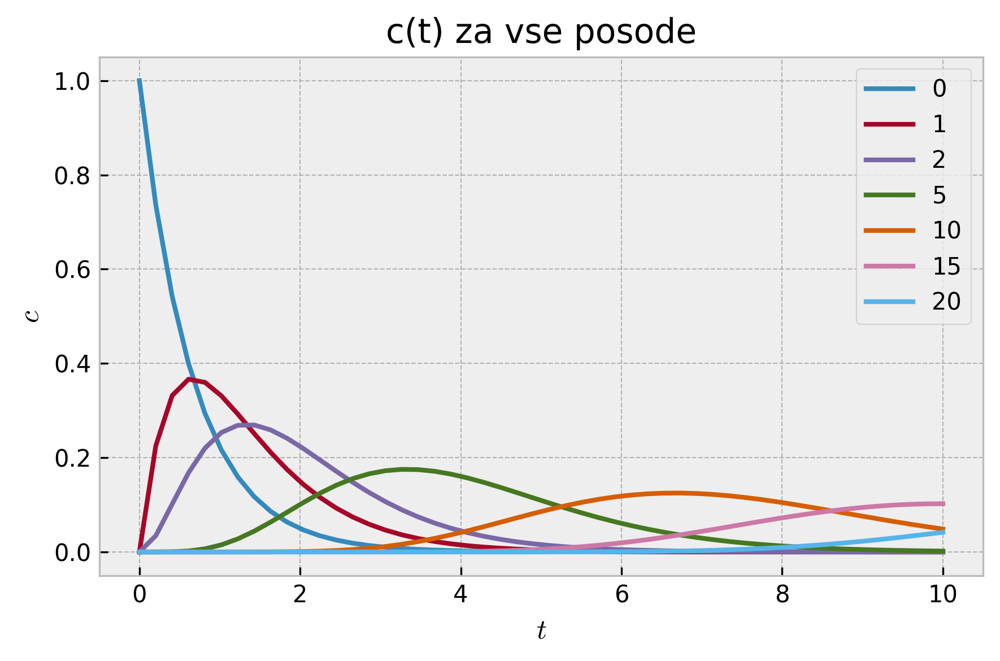

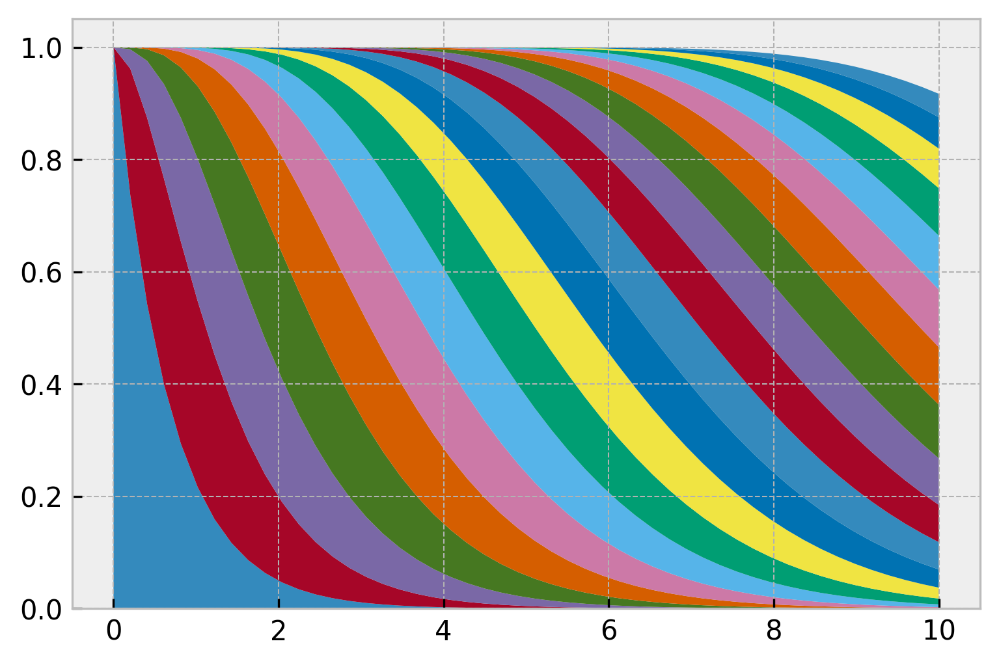

<Figure size 1800x1200 with 0 Axes>

In [523]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")

plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("p0.5.png")
plt.show()
plt.clf()



plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("p0.5area.png")
plt.show()
plt.clf()

In [524]:
p = 0.5
n = 21
mat = B(n, p)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

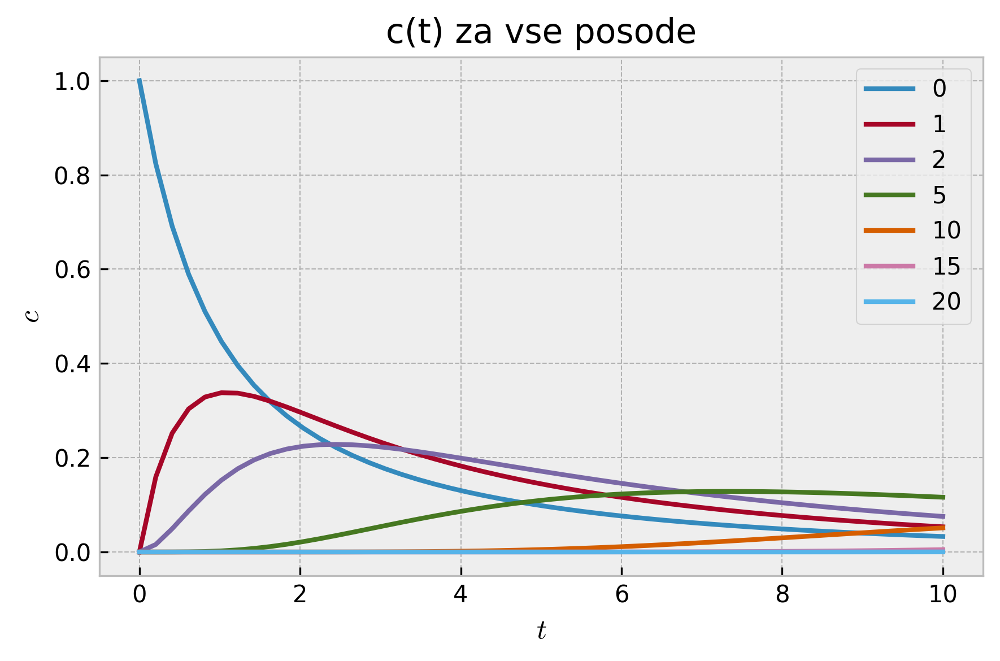

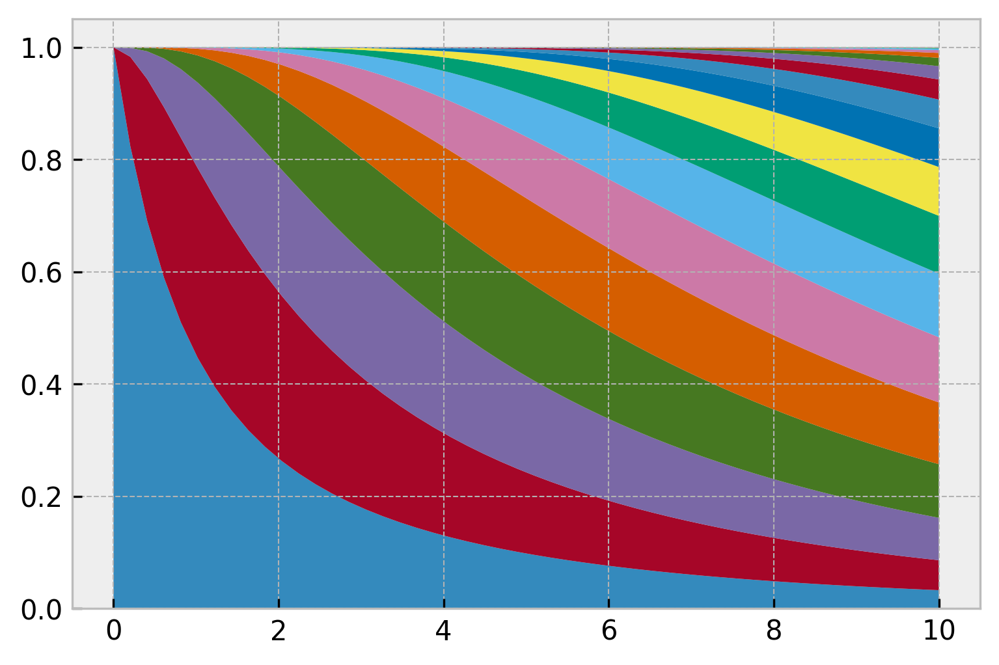

<Figure size 1800x1200 with 0 Axes>

In [525]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")

plt.title("c(t) za vse posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("p0.5.png")
plt.show()
plt.clf()



plt.stackplot(t, *(y[:, i] for i in range(n)))
#plt.savefig("p0.5area.png")
plt.show()
plt.clf()

# spreminjanje Nja

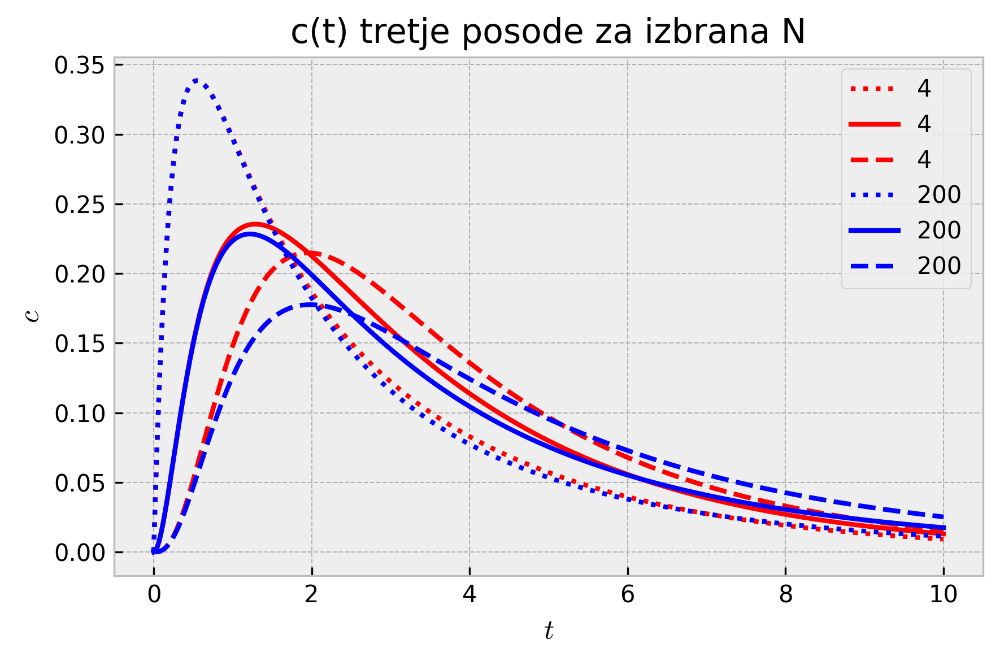

<Figure size 1800x1200 with 0 Axes>

In [549]:
"""
for i in range(2, 20):
    #p = 0 + 0.2*i
    m = 1
    n = i**2
    mat = A(n, m)
    #print(mat)
    c0 = np.zeros(n)
    c0[0] = 1
    #print(c0)
    t = np.linspace(0, 10, 1000)
    def sys(c, t):
        return np.dot(mat, c)
    y = integrate.odeint(sys, c0, t)
    plt.plot(t, y[:, 1], label=f"{n}")
"""
#p = 0 + 0.2*i
m = 1
n = 4
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 10, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.plot(t, y[:, 1], linestyle="dotted", color='red', label=f"{n}")
plt.plot(t, y[:, 2], color='red', label=f"{n}")
plt.plot(t, y[:, 3], linestyle="dashed", color='red', label=f"{n}")

m = 1
n = 200
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 10, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.plot(t, y[:, 1], linestyle="dotted", color='blue', label=f"{n}")
plt.plot(t, y[:, 2], color='blue', label=f"{n}")
plt.plot(t, y[:, 3], linestyle="dashed", color='blue', label=f"{n}")

plt.title("c(t) tretje posode za izbrana N")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("Nm1.png")
plt.show()
plt.clf()

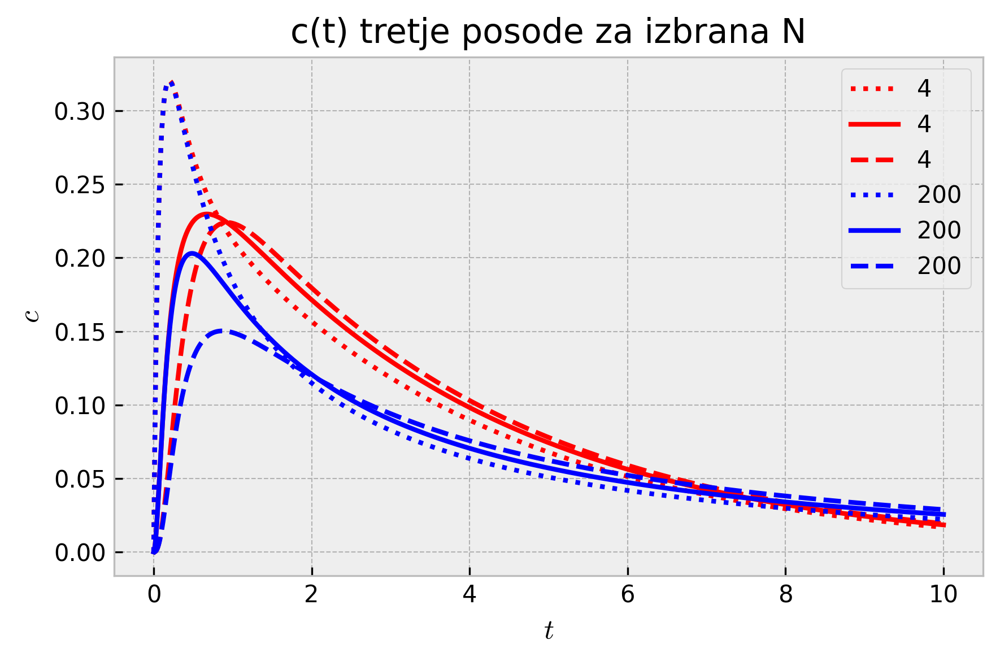

<Figure size 1800x1200 with 0 Axes>

In [548]:
"""
for i in range(2, 20):
    #p = 0 + 0.2*i
    m = 1
    n = i**2
    mat = A(n, m)
    #print(mat)
    c0 = np.zeros(n)
    c0[0] = 1
    #print(c0)
    t = np.linspace(0, 10, 1000)
    def sys(c, t):
        return np.dot(mat, c)
    y = integrate.odeint(sys, c0, t)
    plt.plot(t, y[:, 1], label=f"{n}")
"""
#p = 0 + 0.2*i
m = 5
n = 4
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 10, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.plot(t, y[:, 1], linestyle="dotted", color='red', label=f"{n}")
plt.plot(t, y[:, 2], color='red', label=f"{n}")
plt.plot(t, y[:, 3], linestyle="dashed", color='red', label=f"{n}")

m = 5
n = 200
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 10, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.plot(t, y[:, 1], linestyle="dotted", color='blue', label=f"{n}")
plt.plot(t, y[:, 2], color='blue', label=f"{n}")
plt.plot(t, y[:, 3], linestyle="dashed", color='blue', label=f"{n}")

plt.title("c(t) tretje posode za izbrana N")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("Nm5.png")
plt.show()
plt.clf()

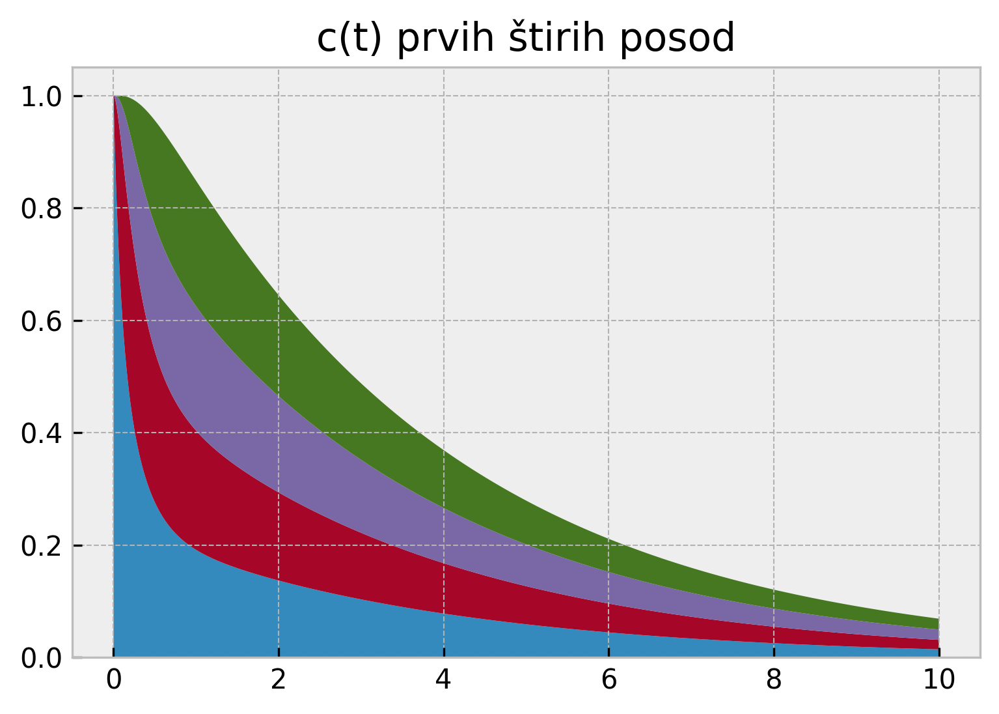

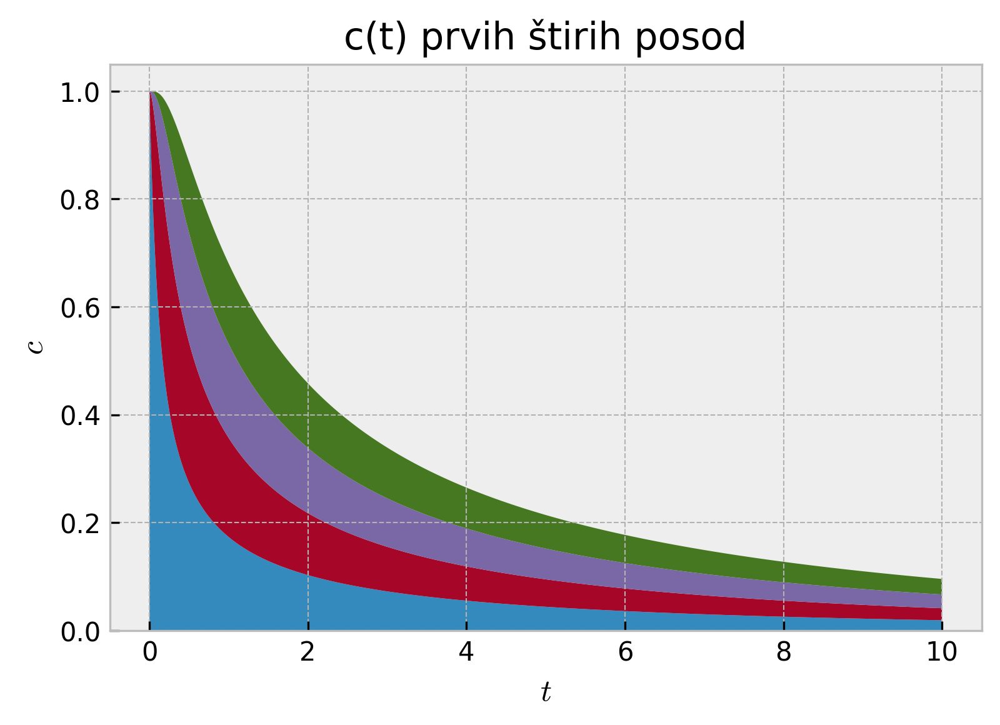

<Figure size 1800x1200 with 0 Axes>

In [550]:
m = 5
n = 4
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 10, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.stackplot(t, *(y[:, i] for i in range(4)))
plt.title("c(t) prvih štirih posod")
plt.savefig("N5area4.png")
plt.show()
plt.clf()



n = 200
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)

def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)
plt.xlabel('$t$')
plt.ylabel('$c$')
plt.stackplot(t, *(y[:, i] for i in range(4)))
plt.title("c(t) prvih štirih posod")
plt.savefig("N5area200.png")
plt.show()
plt.clf()







# mji

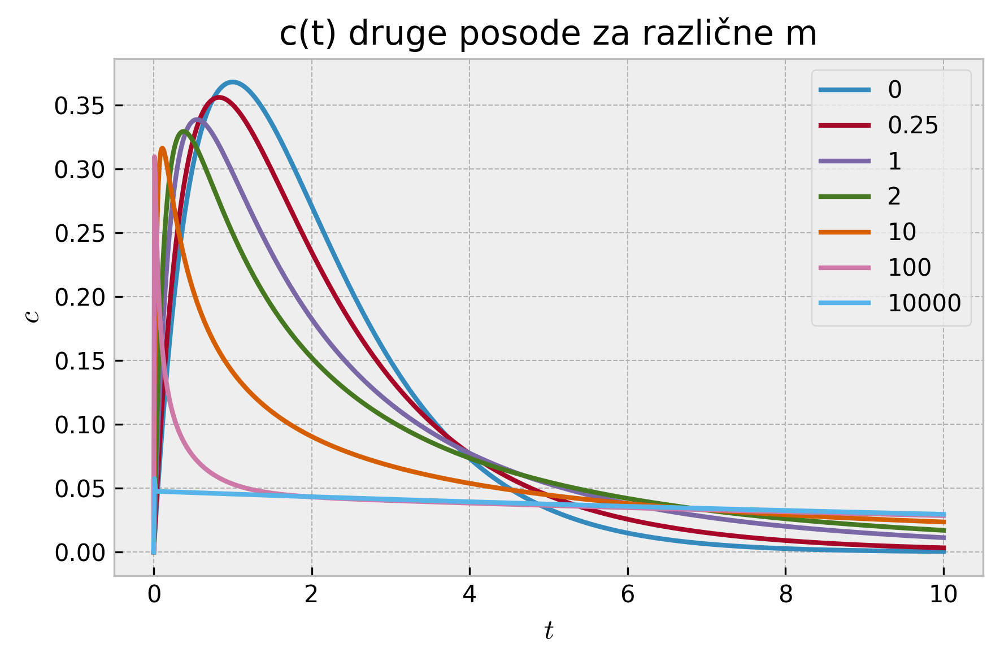

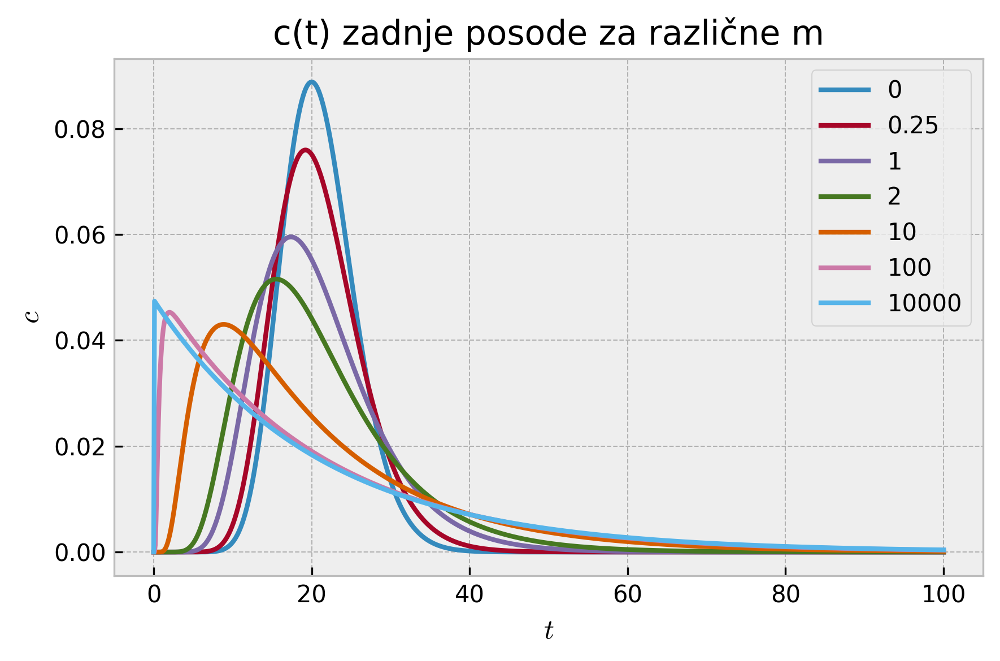

<Figure size 1800x1200 with 0 Axes>

In [529]:
for i in range(7):
    #p = 0 + 0.2*i
    m = [0, 0.25, 1, 2, 10, 100, 10000][i]
    n = 21
    mat = A(n, m)
    #print(mat)
    c0 = np.zeros(n)
    c0[0] = 1
    #print(c0)
    t = np.linspace(0, 10, 1000)
    def sys(c, t):
        return np.dot(mat, c)
    y = integrate.odeint(sys, c0, t)
    plt.plot(t, y[:, 1], label=f"{m}")

plt.title("c(t) druge posode za različne m")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("cm1.png")
plt.show()
plt.clf()

for i in range(7):
    #p = 0 + 0.2*i
    m = [0, 0.25, 1, 2, 10, 100, 10000][i]
    n = 21
    mat = A(n, m)
    #print(mat)
    c0 = np.zeros(n)
    c0[0] = 1
    #print(c0)
    t = np.linspace(0, 100, 1000)
    def sys(c, t):
        return np.dot(mat, c)
    y = integrate.odeint(sys, c0, t)
    plt.plot(t, y[:, 20], label=f"{m}")

plt.title("c(t) zadnje posode za različne m")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("cm20.png")
plt.show()
plt.clf()

In [530]:
m = 0
n = 21
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 40, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

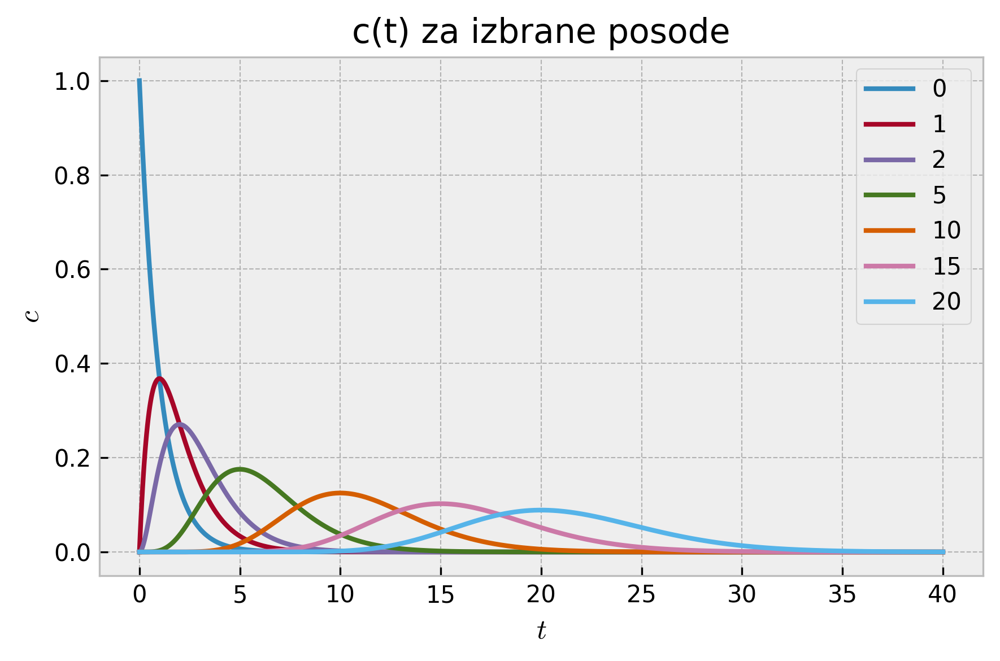

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


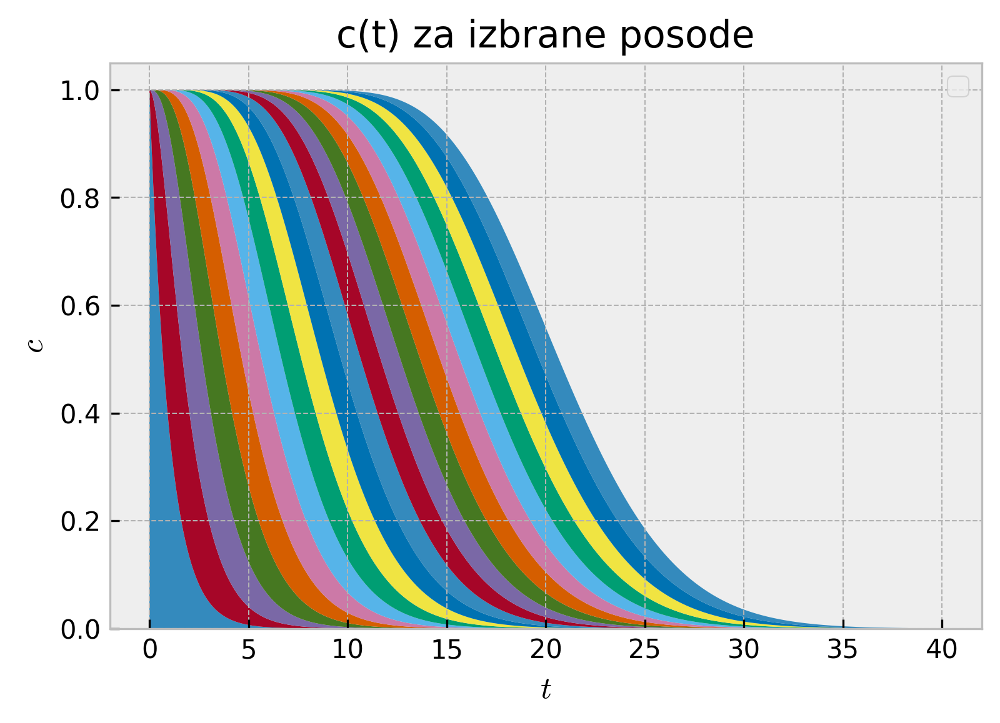

<Figure size 1800x1200 with 0 Axes>

In [531]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("m0.png")
plt.show()
plt.clf()

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("m0area.png")
plt.show()
plt.clf()

In [532]:
m = 0.25
n = 21
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 40, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

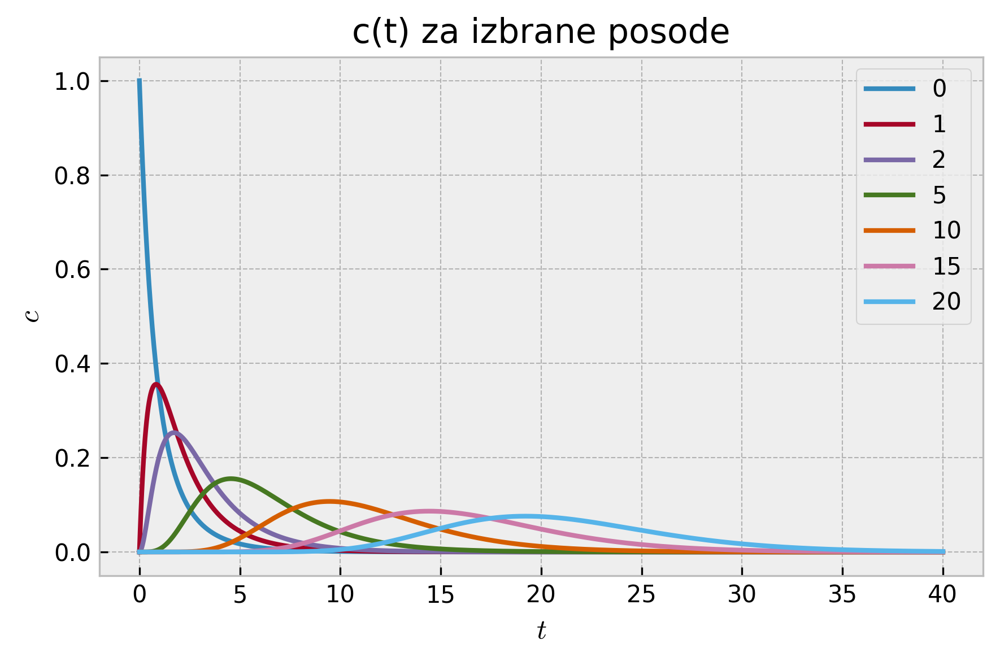

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


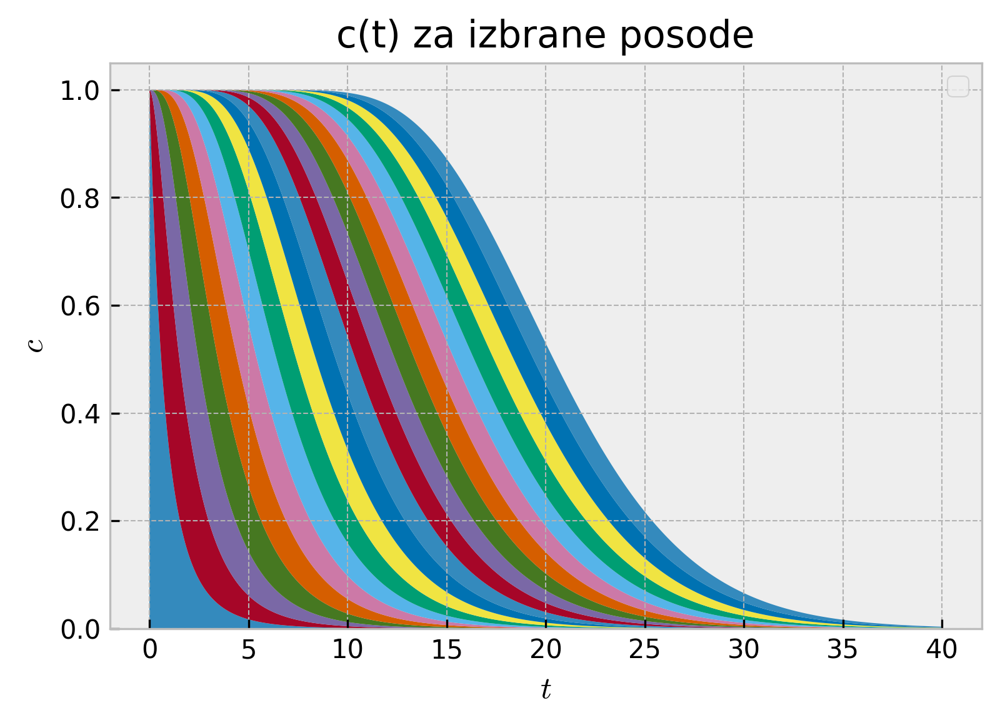

<Figure size 1800x1200 with 0 Axes>

In [533]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("m0.25.png")
plt.show()
plt.clf()

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("m0.25area.png")
plt.show()
plt.clf()

In [534]:
m = 1
n = 21
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 40, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

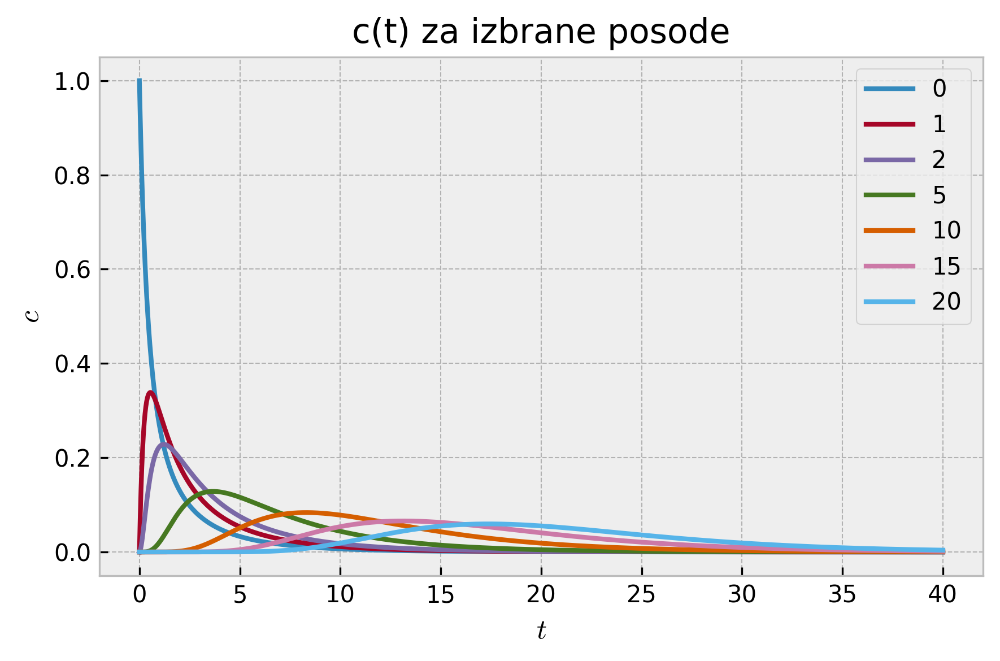

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


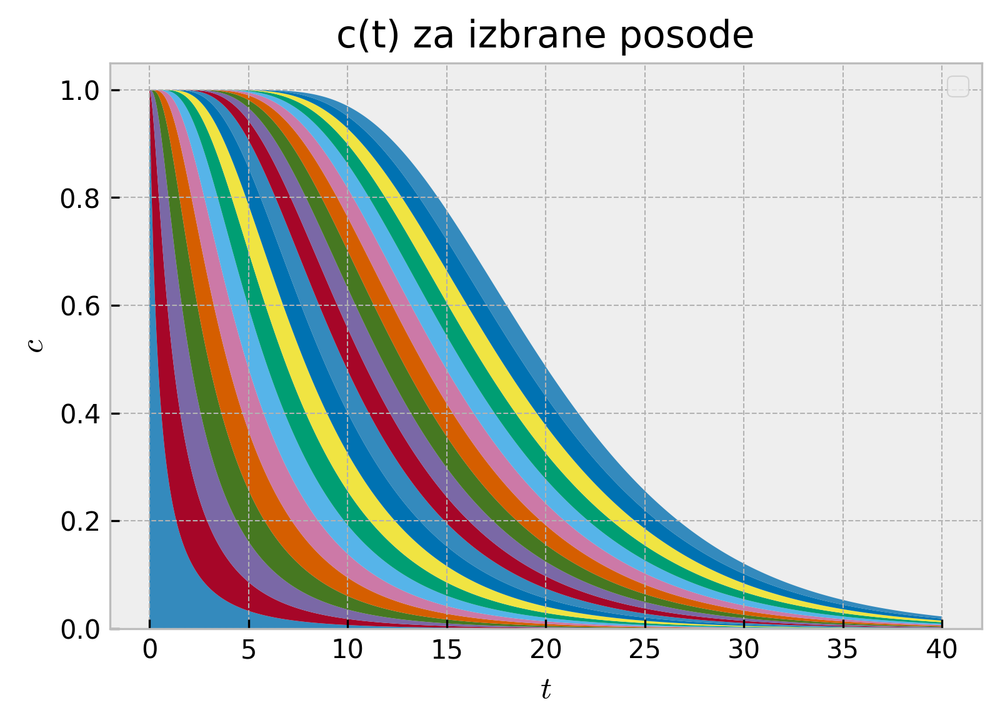

<Figure size 1800x1200 with 0 Axes>

In [535]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("m1.png")
plt.show()
plt.clf()

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("m1area.png")
plt.show()
plt.clf()

In [536]:
m = 10000
n = 21
mat = A(n, m)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 40, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

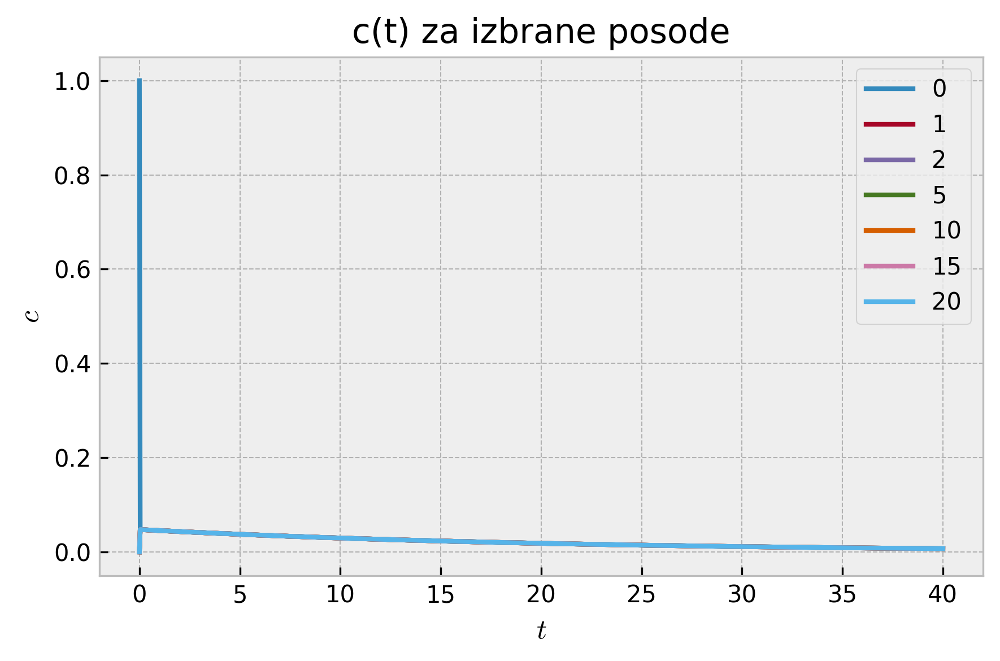

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


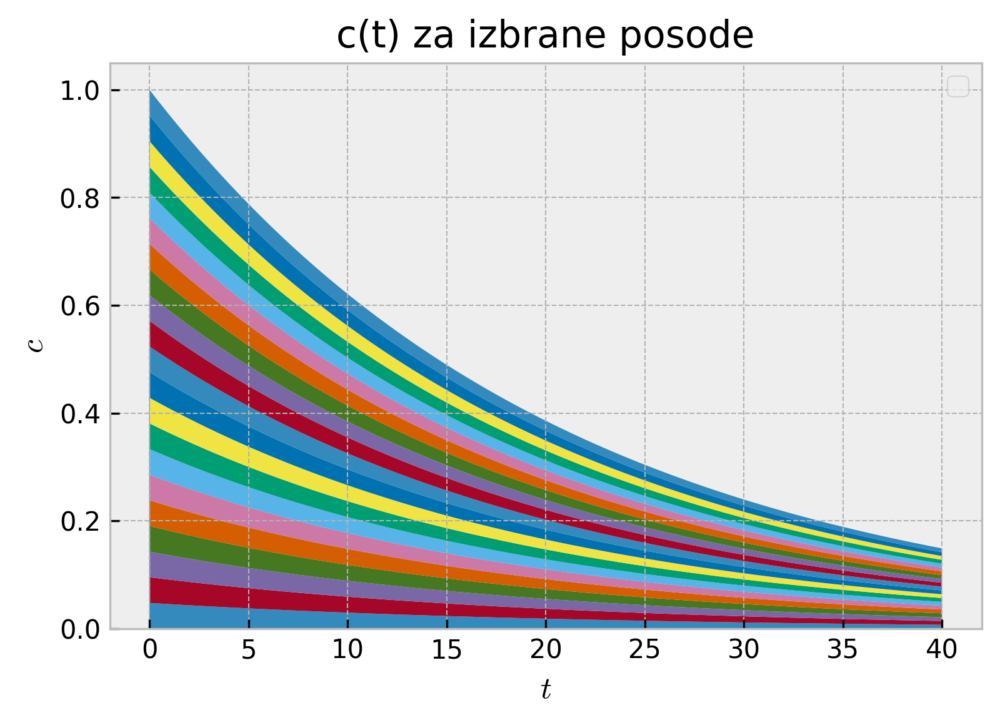

<Figure size 1800x1200 with 0 Axes>

In [537]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("m10000.png")
plt.show()
plt.clf()

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("m10000area.png")
plt.show()
plt.clf()

# pji


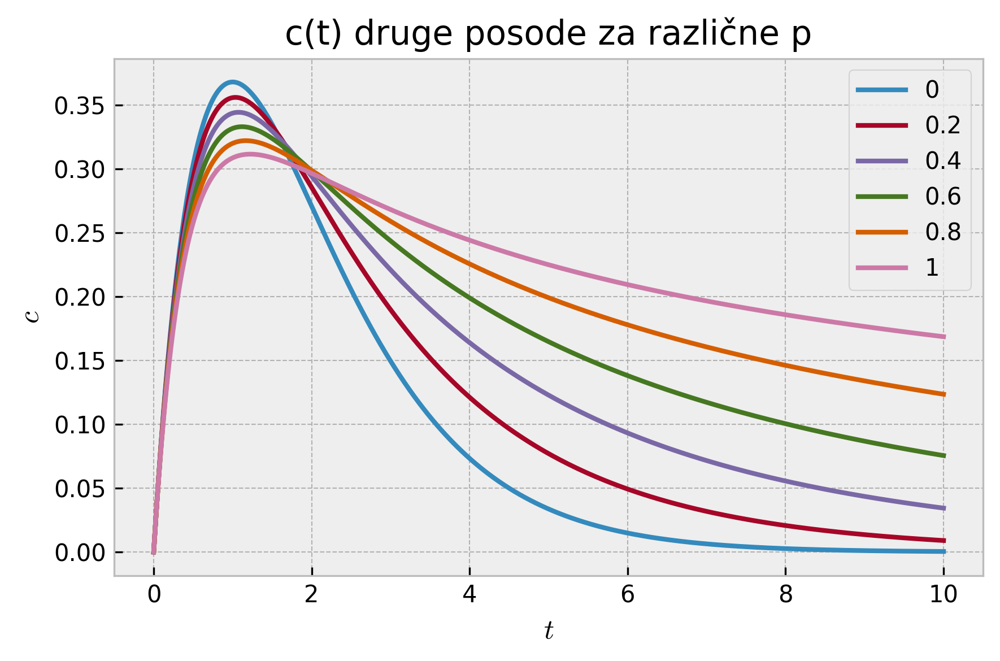

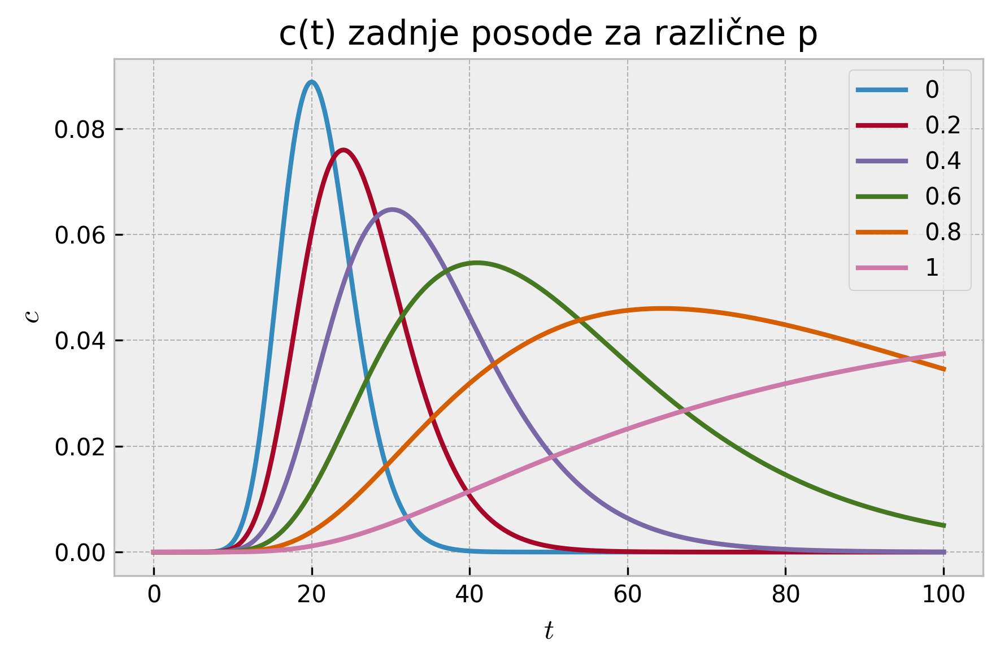

<Figure size 1800x1200 with 0 Axes>

In [538]:
for i in range(6):
    p = 0 + 0.2*i
    p = [0, 0.2, 0.4, 0.6, 0.8, 1][i]
    n = 21
    mat = B(n, p)
    #print(mat)
    c0 = np.zeros(n)
    c0[0] = 1
    #print(c0)
    t = np.linspace(0, 10, 1000)
    def sys(c, t):
        return np.dot(mat, c)
    y = integrate.odeint(sys, c0, t)
    plt.plot(t, y[:, 1], label=f"{p}")

plt.title("c(t) druge posode za različne p")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("cp1.png")
plt.show()
plt.clf()

for i in range(6):
    p = 0 + 0.2*i
    p = [0, 0.2, 0.4, 0.6, 0.8, 1][i]
    n = 21
    mat = B(n, p)
    #print(mat)
    c0 = np.zeros(n)
    c0[0] = 1
    #print(c0)
    t = np.linspace(0, 100, 1000)
    def sys(c, t):
        return np.dot(mat, c)
    y = integrate.odeint(sys, c0, t)
    plt.plot(t, y[:, 20], label=f"{p}")

plt.title("c(t) zadnje posode za različne p")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("cp20.png")
plt.show()
plt.clf()

In [539]:
p = 1
n = 21
mat = B(n, p)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
t = np.linspace(0, 80, 1000)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

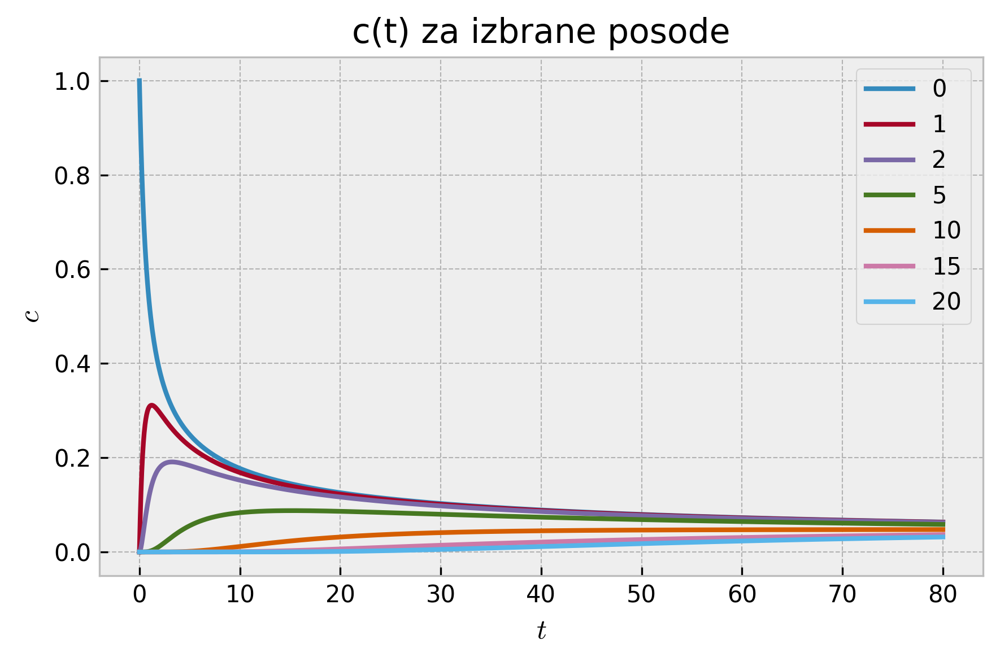

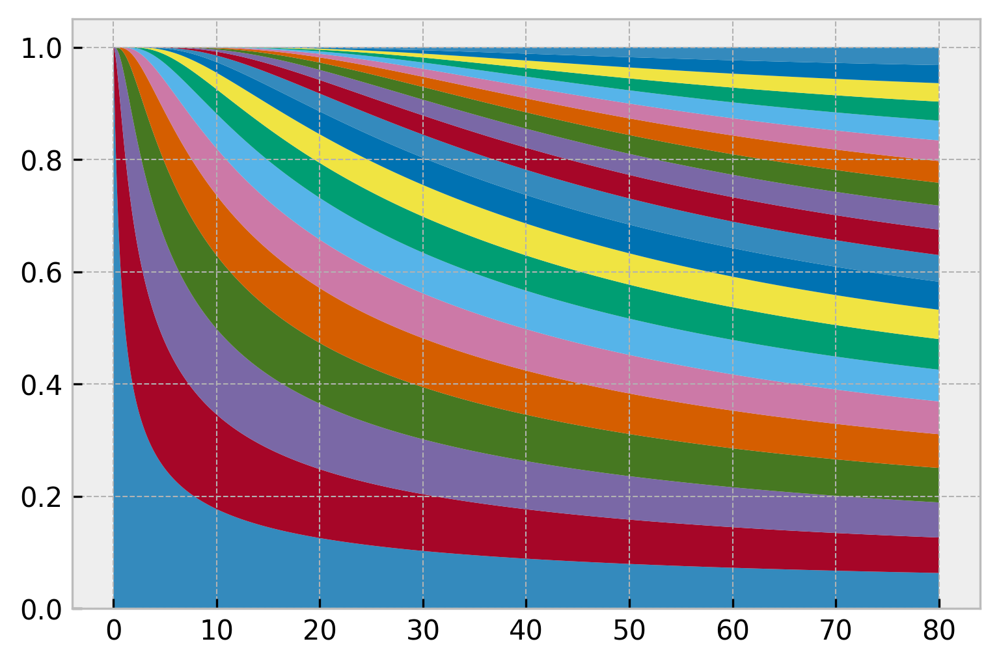

<Figure size 1800x1200 with 0 Axes>

In [540]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")


plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("p1.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("p1area.png")
plt.show()
plt.clf()

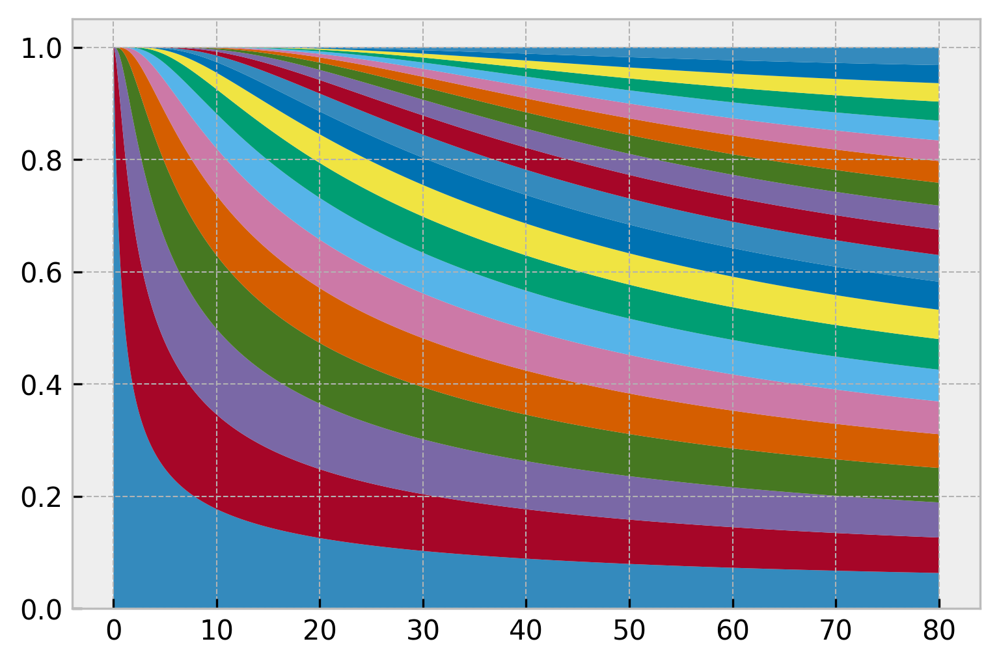

In [541]:
plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.show()

In [542]:
p = 0.5
n = 21
mat = B(n, p)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

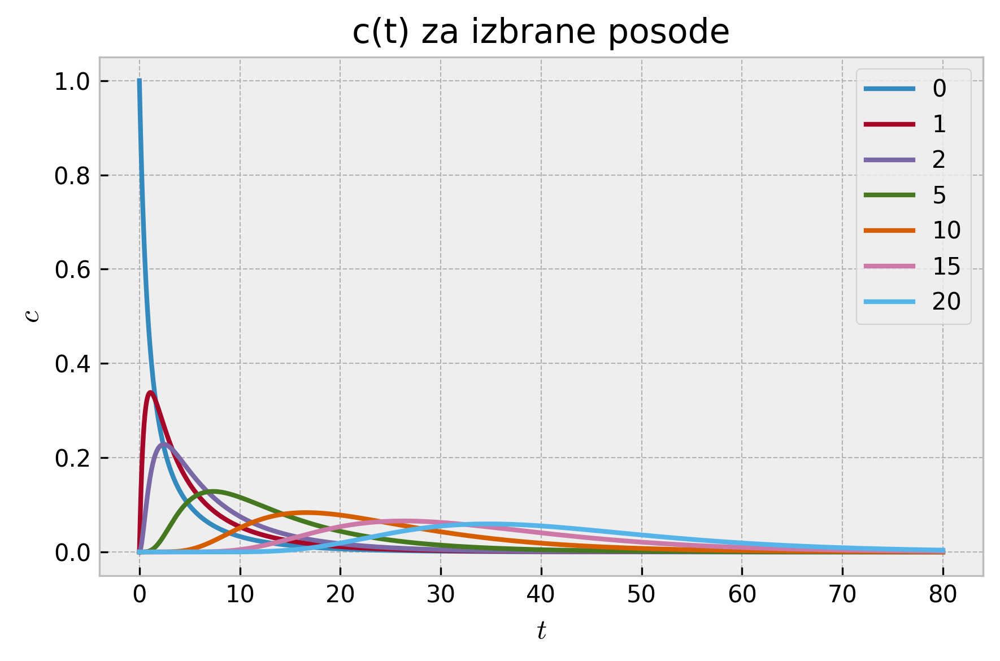

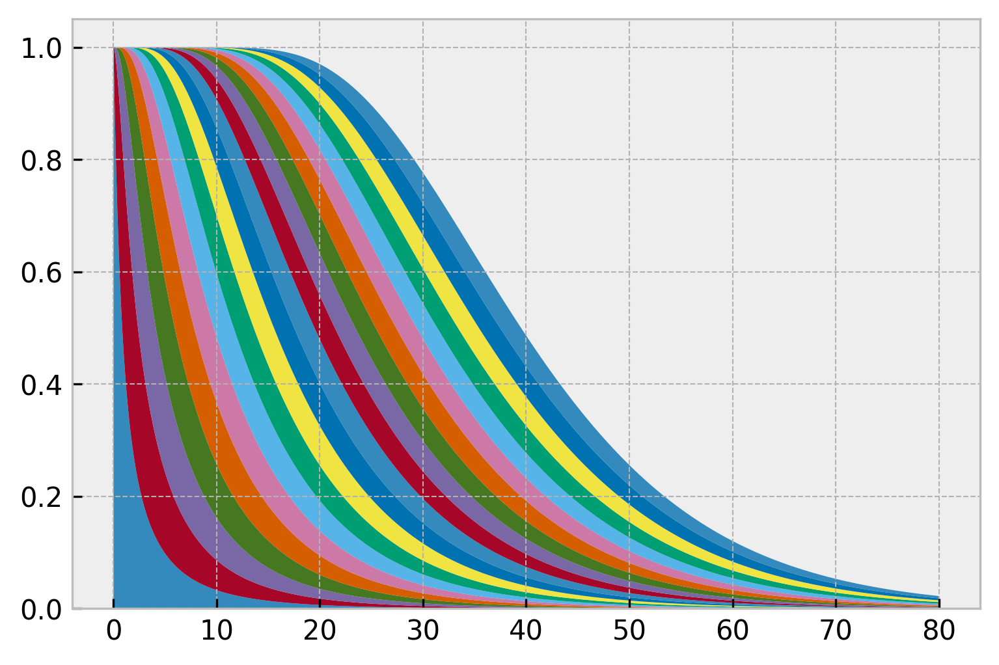

<Figure size 1800x1200 with 0 Axes>

In [543]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("p0.5.png")
plt.show()
plt.clf()



plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("p0.5area.png")
plt.show()
plt.clf()

In [544]:
p = 0.2
n = 21
mat = B(n, p)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

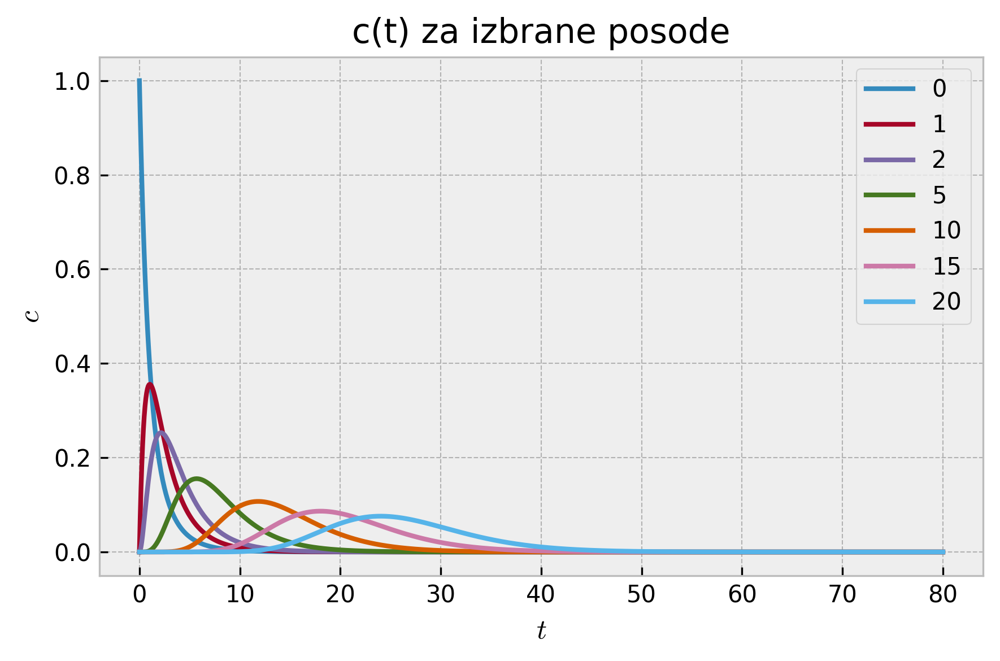

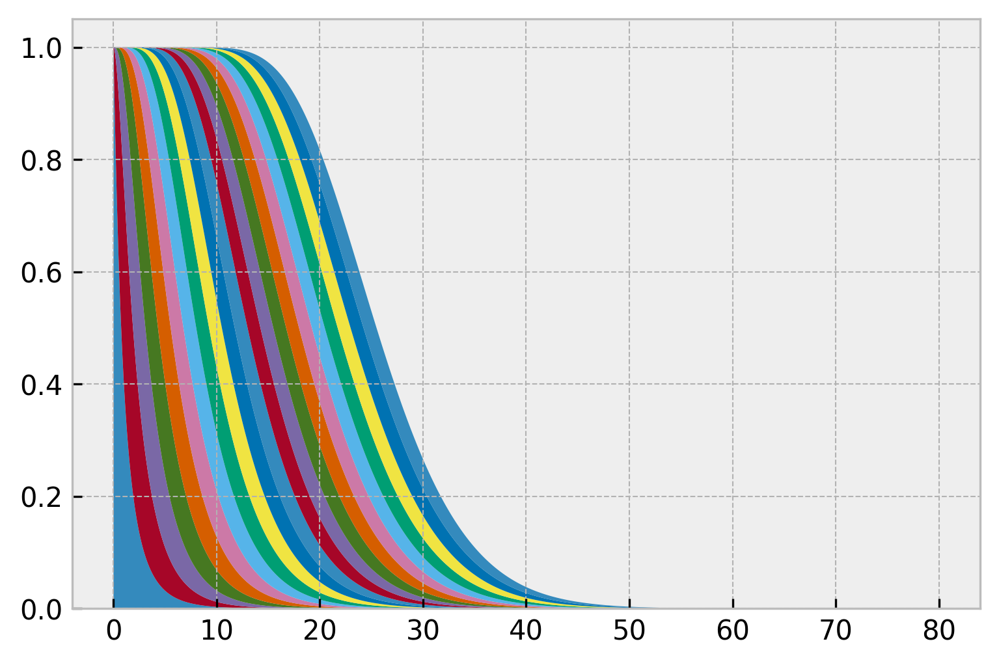

<Figure size 1800x1200 with 0 Axes>

In [545]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("p0.2.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("p0.2area.png")
plt.show()
plt.clf()

In [546]:
p = 0
n = 21
mat = B(n, p)
#print(mat)
c0 = np.zeros(n)
c0[0] = 1
#print(c0)
def sys(c, t):
    return np.dot(mat, c)
y = integrate.odeint(sys, c0, t)

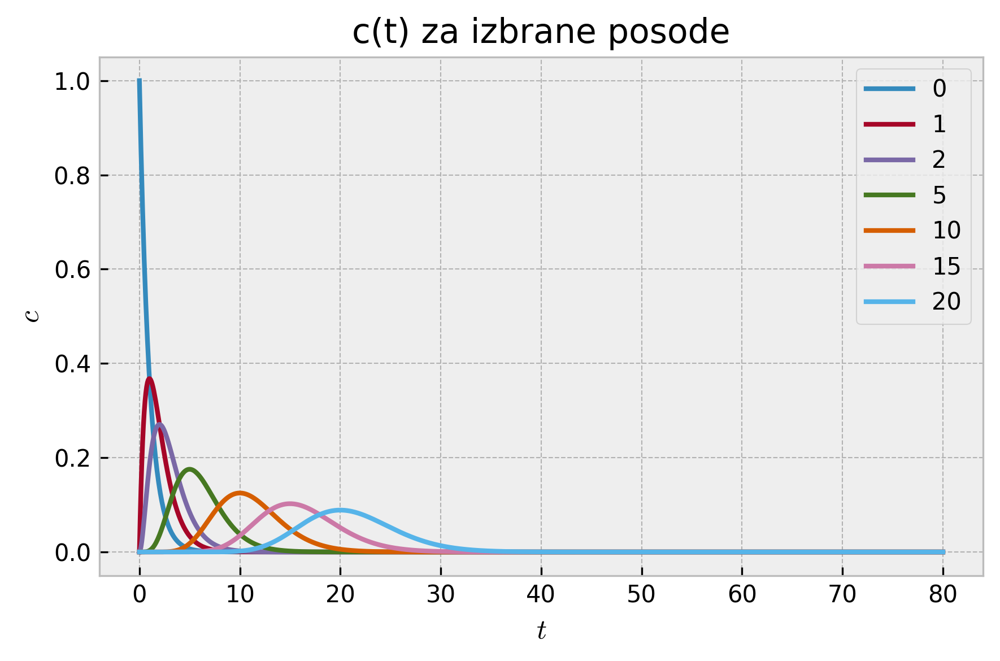

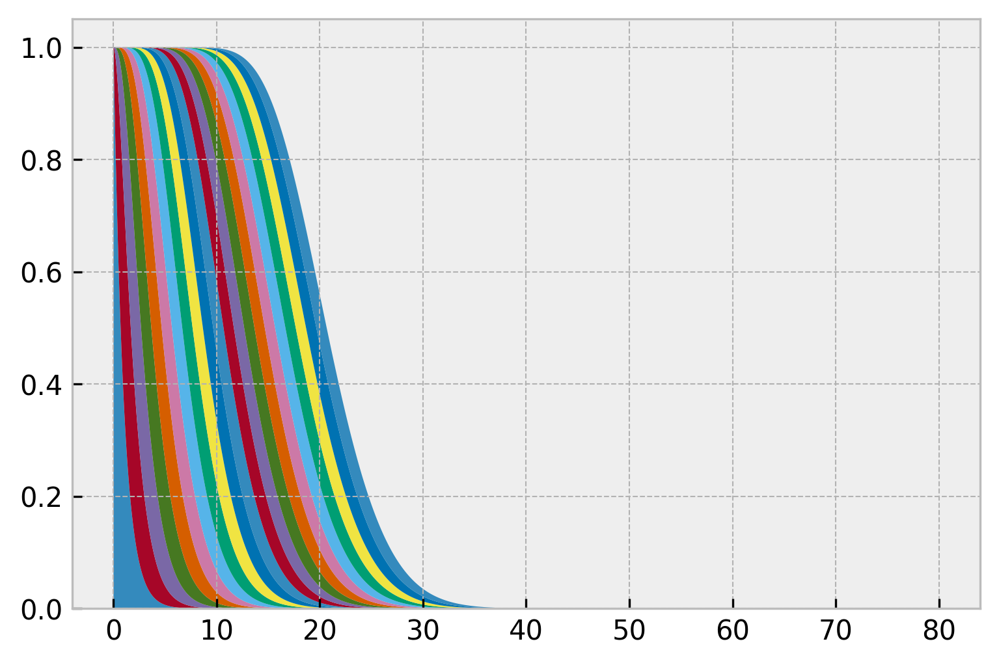

<Figure size 1800x1200 with 0 Axes>

In [547]:
plt.style.use('bmh')
plt.plot(t, y[:, 0], label=f"0")
plt.plot(t, y[:, 1], label=f"1")
plt.plot(t, y[:, 2], label=f"2")
for i in range(n):
    
    if i % 5 == 0 and i != 0:
        plt.plot(t, y[:, i], label=f"{i}")

plt.title("c(t) za izbrane posode")

plt.xlabel('$t$')
plt.ylabel('$c$')
plt.legend()
plt.tight_layout()
plt.savefig("p0.png")
plt.show()
plt.clf()

plt.stackplot(t, *(y[:, i] for i in range(n)))
plt.savefig("p0area.png")
plt.show()
plt.clf()

prejšnje
